In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd drive/MyDrive/effi

Mounted at /content/drive
/content/drive/MyDrive/effi


In [ ]:
!pip install -r requirements.txt
!pip install numpy==1.23.4
!pip install pandas
!pip install matplotlib
!pip install effdet
!pip install albumentations
!pip install pytorch-lightning==1.2.10
!pip install fastcore==1.3.20
!pip install ensemble-boxes==1.0.6
!pip install torchtext==0.6.0
!pip install efficientnet_pytorch
!pip install git+https://github.com/alexhock/object-detection-metrics

In [ ]:
from pathlib import Path
import skimage.io as io
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
from pathlib import Path
import PIL
import numpy as np
from effdet.config.model_config import efficientdet_model_param_dict
from effdet import get_efficientdet_config, EfficientDet, DetBenchTrain
from effdet.efficientdet import HeadNet
from effdet.config.model_config import efficientdet_model_param_dict
import timm
import torch
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import locale
locale.getpreferredencoding = lambda: "UTF-8"
from pytorch_lightning import LightningDataModule
from torch.utils.data import DataLoader
from numbers import Number
from typing import List
from functools import singledispatch
from pytorch_lightning.metrics import functional as metrics

from efficientnet_pytorch import EfficientNet
from fastcore.dispatch import typedispatch
from pytorch_lightning import LightningModule
from pytorch_lightning.core.decorators import auto_move_data


from ensemble_boxes import ensemble_boxes_wbf
from fastcore.basics import patch
from objdetecteval.metrics.coco_metrics import get_coco_stats

from effdet.config.fpn_config import get_fpn_config
from omegaconf import OmegaConf
import itertools


from pytorch_lightning import Trainer


# Dataset

In [4]:
dataset_path = Path('')
# list(dataset_path.iterdir())

train_data_path = dataset_path/'Dataset'/'train'
valid_data_path = dataset_path/'Dataset'/'valid'
test_data_path = dataset_path/'Dataset'/'test'
# io.imshow(io.imread(str(train_data_path/'2023-02-28-12-21-08_jpg.rf.a77dae93a3efef402bbb93b91eb661b7.jpg')))

In [5]:
# Get the annotations
df = pd.read_csv('Dataset/train_annotations.csv')
# Remove columnns- image_width, image_height, class
df = df.drop(columns=['width', 'height', 'class'])
df.head()

,filename,xmin,ymin,xmax,ymax
0,2023-02-28-12-32-37_jpg.rf.fdd2a5f98e53af8f17e...,0,430,65,532
1,2023-02-28-12-32-37_jpg.rf.fdd2a5f98e53af8f17e...,448,603,612,640
2,2023-02-28-12-32-37_jpg.rf.fdd2a5f98e53af8f17e...,94,465,198,577
3,2023-02-28-12-32-37_jpg.rf.fdd2a5f98e53af8f17e...,0,78,33,124
4,2023-02-28-12-32-37_jpg.rf.fdd2a5f98e53af8f17e...,0,22,102,132


In [6]:
# Check for invalid bounding boxes
invalid_bboxes = df[(df['xmax'] <= df['xmin']) | (df['ymax'] <= df['ymin'])]

if not invalid_bboxes.empty:
    print("Invalid bounding boxes found:")
    print(invalid_bboxes)
    for index, row in invalid_bboxes.iterrows():
        # Correct the bounding box coordinates
        x_min, y_min, x_max, y_max = row['xmin'], row['ymin'], row['xmax'], row['ymax']

        # Example correction (you may need to adjust these values)
        new_x_min = min(x_min, x_max)
        new_x_max = max(x_min, x_max)
        new_y_min = min(y_min, y_max)
        new_y_max = max(y_min, y_max)

        # Update the DataFrame with corrected values
        df.at[index, 'xmin'] = new_x_min-0.05
        df.at[index, 'xmax'] = new_x_max
        df.at[index, 'ymin'] = new_y_min-0.05
        df.at[index, 'ymax'] = new_y_max
else:
    print("All bounding boxes are valid.")

invalid_bboxes = df[(df['xmax'] <= df['xmin']) | (df['ymax'] <= df['ymin'])]
print(invalid_bboxes)

All bounding boxes are valid.
Empty DataFrame
Columns: [filename, xmin, ymin, xmax, ymax]
Index: []


In [7]:
# Get the annotations
df_valid = pd.read_csv('Dataset/valid_annotations.csv')

#remove columnns- image_width, image_height, class
df_valid = df_valid.drop(columns=['width', 'height', 'class'])
df_valid.head()

,filename,xmin,ymin,xmax,ymax
0,2023-02-28-12-24-16_jpg.rf.4a16efe7f24884cc501...,45,22,106,109
1,2023-02-28-12-24-16_jpg.rf.4a16efe7f24884cc501...,138,31,184,113
2,2023-02-28-12-24-16_jpg.rf.4a16efe7f24884cc501...,205,35,252,109
3,2023-02-28-12-24-16_jpg.rf.4a16efe7f24884cc501...,280,32,346,118
4,2023-02-28-12-24-16_jpg.rf.4a16efe7f24884cc501...,381,38,429,124


In [9]:
# Get the annotations
df_test = pd.read_csv('Dataset/test_annotations.csv')

#remove columnns- image_width, image_height, class
df_test = df_test.drop(columns=['width', 'height', 'class'])
df_test.head()

,filename,xmin,ymin,xmax,ymax
0,PXL_20230818_095019670_jpg.rf.66180fa518c6e53b...,0,114,36,176
1,PXL_20230818_095019670_jpg.rf.66180fa518c6e53b...,10,84,37,136
2,PXL_20230818_095019670_jpg.rf.66180fa518c6e53b...,30,125,51,141
3,PXL_20230818_095019670_jpg.rf.66180fa518c6e53b...,34,81,81,130
4,PXL_20230818_095019670_jpg.rf.66180fa518c6e53b...,183,50,219,114


In [11]:
# Get the annotations of the bounding boxes
def get_rectangle_edges_from_pascal_bbox(bbox):
    xmin_top_left, ymin_top_left, xmax_bottom_right, ymax_bottom_right = bbox

    bottom_left = (xmin_top_left, ymax_bottom_right)
    width = xmax_bottom_right - xmin_top_left
    height = ymin_top_left - ymax_bottom_right

    return bottom_left, width, height

# Draw the bounding boxes on the image
def draw_pascal_voc_bboxes(
    plot_ax,
    bboxes,
    get_rectangle_corners_fn=get_rectangle_edges_from_pascal_bbox,
):
    for bbox in bboxes:
        bottom_left, width, height = get_rectangle_corners_fn(bbox)

        rect_1 = patches.Rectangle(
            bottom_left,
            width,
            height,
            linewidth=5,
            edgecolor="black",
            fill=False,
        )
        rect_2 = patches.Rectangle(
            bottom_left,
            width,
            height,
            linewidth=3,
            edgecolor="red",
            fill=False,
        )

        # Add the patch to the Axes
        plot_ax.add_patch(rect_1)
        plot_ax.add_patch(rect_2)

def draw_pascal_voc_bboxes_r(
    plot_ax,
    bboxes,
    get_rectangle_corners_fn=get_rectangle_edges_from_pascal_bbox,
):
    for bbox in bboxes:
        bottom_left, width, height = get_rectangle_corners_fn(bbox)

        rect_1 = patches.Rectangle(
            bottom_left,
            width,
            height,
            linewidth=5,
            edgecolor="black",
            fill=False,
        )
        rect_2 = patches.Rectangle(
            bottom_left,
            width,
            height,
            linewidth=3,
            edgecolor="blue",
            fill=False,
        )

        # Add the patch to the Axes
        plot_ax.add_patch(rect_1)
        plot_ax.add_patch(rect_2)

def draw_pascal_voc_bboxes_g(
    plot_ax,
    bboxes,
    get_rectangle_corners_fn=get_rectangle_edges_from_pascal_bbox,
):
    for bbox in bboxes:
        bottom_left, width, height = get_rectangle_corners_fn(bbox)

        rect_1 = patches.Rectangle(
            bottom_left,
            width,
            height,
            linewidth=7,
            edgecolor="black",
            fill=False,
        )
        rect_2 = patches.Rectangle(
            bottom_left,
            width,
            height,
            linewidth=5,
            edgecolor="white",
            fill=False,
        )

        # Add the patch to the Axes
        plot_ax.add_patch(rect_1)
        plot_ax.add_patch(rect_2)

def show_image(
    image, bboxes=None, draw_bboxes_fn=draw_pascal_voc_bboxes, figsize=(10, 10)
):
    fig, ax = plt.subplots(1, figsize=figsize)
    ax.imshow(image)

    if bboxes is not None:
        draw_bboxes_fn(ax, bboxes)

    plt.show()


In [12]:
class FossilDatasetAdaptor:
    def __init__(self, images_dir_path, annotations_dataframe):
        self.images_dir_path = Path(images_dir_path)
        self.annotations_df = annotations_dataframe
        self.images = self.annotations_df.filename.unique().tolist()

    def __len__(self) -> int:
        return len(self.images)

    def get_image_and_labels_by_idx(self, index):
        image_name = self.images[index]
        image = PIL.Image.open(self.images_dir_path / image_name)
        pascal_bboxes = self.annotations_df[self.annotations_df.filename == image_name][
            ["xmin", "ymin", "xmax", "ymax"]
        ].values
        class_labels = np.ones(len(pascal_bboxes))

        return image, pascal_bboxes, class_labels, index

    def show_image(self, index):
        image, bboxes, class_labels, image_id = self.get_image_and_labels_by_idx(index)
        print(f"image_id: {image_id}")
        show_image(image, bboxes.tolist())
        print(class_labels)

image_id: 1


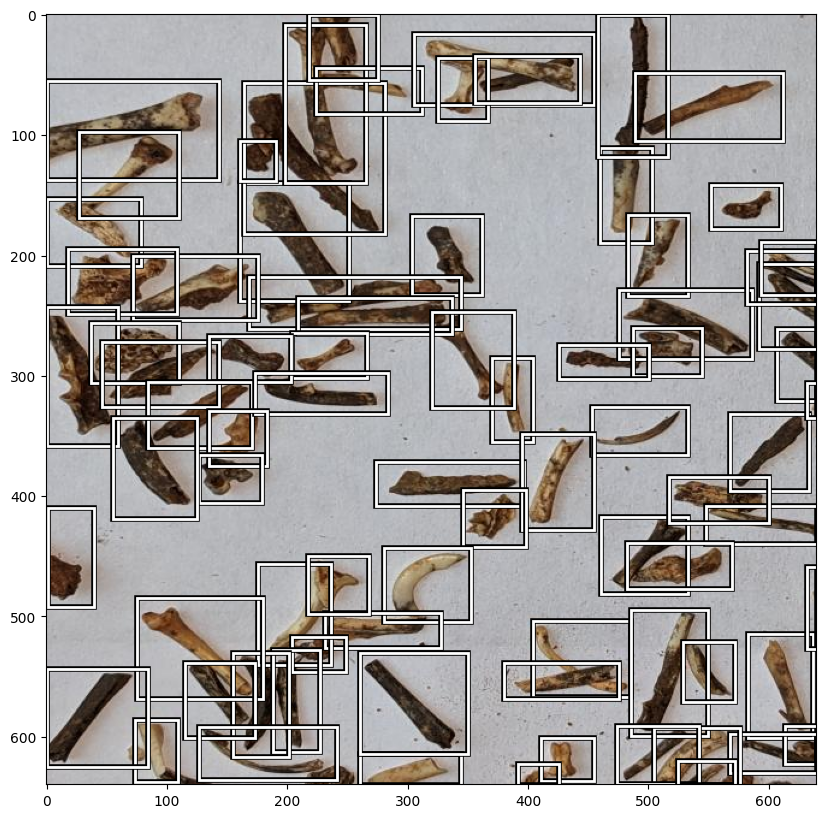

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1.]


In [13]:
df = pd.DataFrame(df)
fossil_train_ds = FossilDatasetAdaptor(train_data_path, df)
fossil_train_ds.show_image(1)

image_id: 1


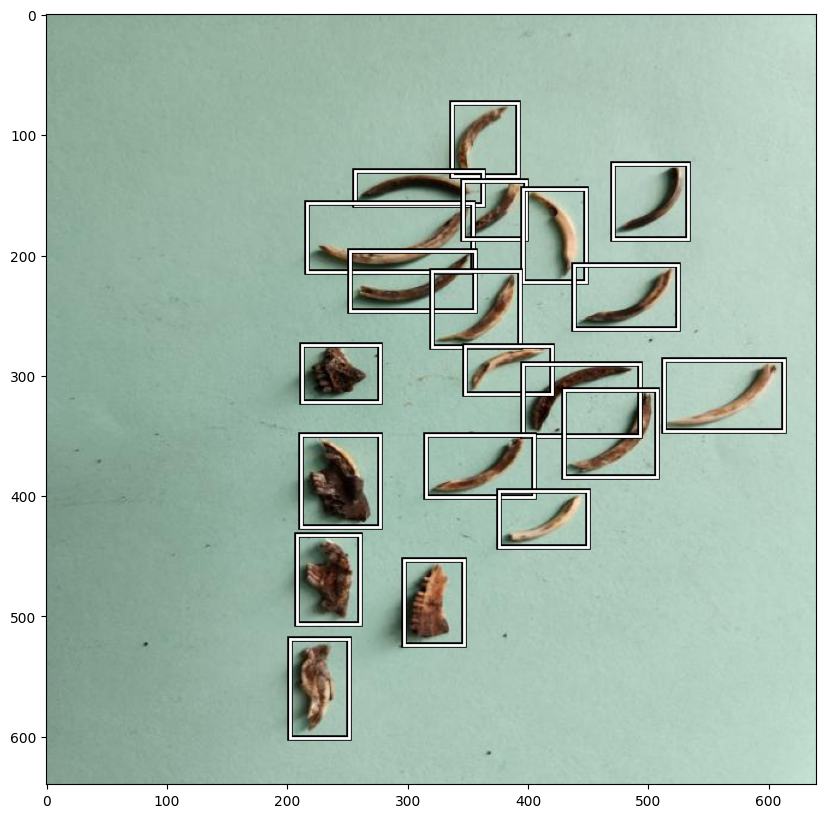

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [14]:
df_valid = pd.DataFrame(df_valid)
fossil_valid_ds = FossilDatasetAdaptor(valid_data_path, df_valid)
fossil_valid_ds.show_image(1)

image_id: 1


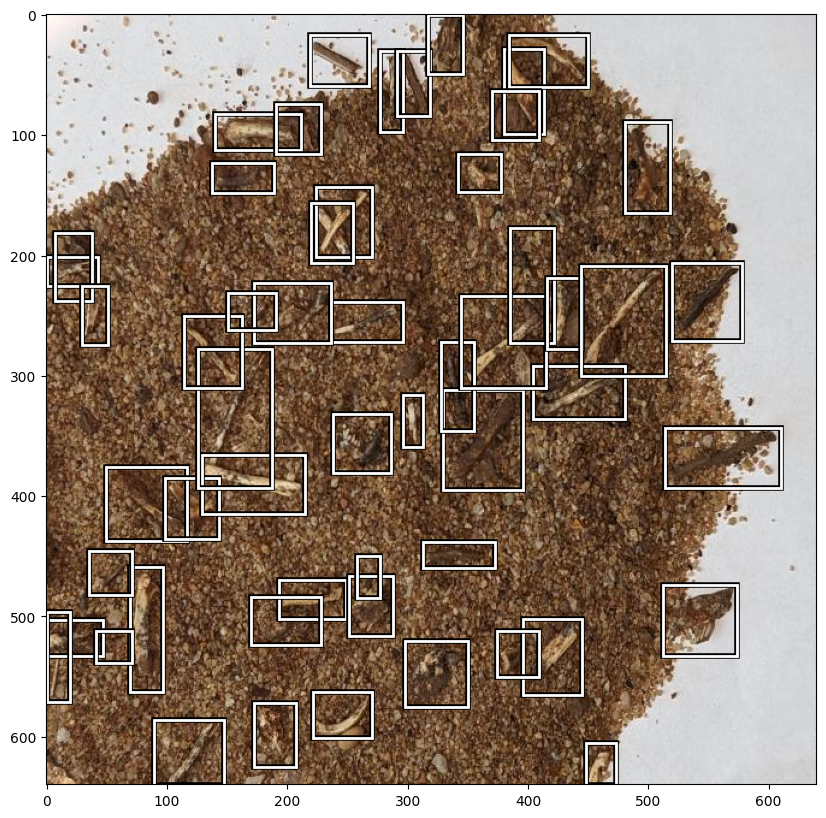

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1.]


In [15]:
df_test= pd.DataFrame(df_test)
fossil_test_ds = FossilDatasetAdaptor(test_data_path, df_test)
fossil_test_ds.show_image(1)


Creating the model

In [17]:
print(f'number of configs: {len(efficientdet_model_param_dict)}')
list(efficientdet_model_param_dict.keys())[::3]
timm.list_models('tf_efficientnetv2_*')

number of configs: 47


['efficientdet_d0',
 'efficientdet_d3',
 'efficientdetv2_dt',
 'cspresdet50',
 'cspdarkdet53',
 'mixdet_l',
 'mobiledetv3_large',
 'efficientdet_q2',
 'efficientdet_em',
 'tf_efficientdet_d1',
 'tf_efficientdet_d4',
 'tf_efficientdet_d7',
 'tf_efficientdet_d1_ap',
 'tf_efficientdet_d4_ap',
 'tf_efficientdet_lite1',
 'tf_efficientdet_lite3x']

Define the EfficientDet Dataset

In [19]:
#Get the Transformation
def get_train_transforms(target_img_size=512):
    return A.Compose(
        [
            A.HorizontalFlip(p=0.5),
            A.Resize(height=target_img_size, width=target_img_size, p=1),
            A.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
            ToTensorV2(p=1),
        ],
        p=1.0,
        bbox_params=A.BboxParams(
            format="pascal_voc", min_area=0, min_visibility=0, label_fields=["labels"]
        ),
    )


def get_valid_transforms(target_img_size=512):
    return A.Compose(
        [
            A.Resize(height=target_img_size, width=target_img_size, p=1),
            A.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
            ToTensorV2(p=1),
        ],
        p=1.0,
        bbox_params=A.BboxParams(
            format="pascal_voc", min_area=0, min_visibility=0, label_fields=["labels"]
        ),
    )
def get_test_transforms(target_img_size=512):
    return A.Compose(
        [
            A.Resize(height=target_img_size, width=target_img_size, p=1),
            A.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
            ToTensorV2(p=1),
        ],
        p=1.0,
        bbox_params=A.BboxParams(
            format="pascal_voc", min_area=0, min_visibility=0, label_fields=["labels"]
        ),
    )

# Dataset handler
class EfficientDetDataset(Dataset):
    def __init__(
        self, dataset_adaptor, transforms=get_valid_transforms()
    ):
        self.ds = dataset_adaptor
        self.transforms = transforms

    def __getitem__(self, index):
        (
            image,
            pascal_bboxes,
            class_labels,
            image_id,
        ) = self.ds.get_image_and_labels_by_idx(index)

        sample = {
            "image": np.array(image, dtype=np.float32),
            "bboxes": pascal_bboxes,
            "labels": class_labels,
        }

        sample = self.transforms(**sample)
        sample["bboxes"] = np.array(sample["bboxes"])
        image = sample["image"]
        pascal_bboxes = sample["bboxes"]
        labels = sample["labels"]

        _, new_h, new_w = image.shape
        sample["bboxes"][:, [0, 1, 2, 3]] = sample["bboxes"][
            :, [1, 0, 3, 2]
        ]  # convert to yxyx

        target = {
            "bboxes": torch.as_tensor(sample["bboxes"], dtype=torch.float32),
            "labels": torch.as_tensor(labels),
            "image_id": torch.tensor([image_id]),
            "img_size": (new_h, new_w),
            "img_scale": torch.tensor([1.0]),
        }

        return image, target, image_id

    def __len__(self):
        return len(self.ds)

Define the DataModule

In [21]:
class EfficientDetDataModule(LightningDataModule):

    def __init__(self,
                train_dataset_adaptor,
                validation_dataset_adaptor,
                test_dataset_adaptor,
                train_transforms=get_train_transforms(target_img_size=512),
                valid_transforms=get_valid_transforms(target_img_size=512),
                test_transforms=get_test_transforms(target_img_size=512),
                num_workers=4,
                batch_size=8):

        self.train_ds = train_dataset_adaptor
        self.valid_ds = validation_dataset_adaptor
        self.test_ds = test_dataset_adaptor
        self.train_tfms = train_transforms
        self.valid_tfms = valid_transforms
        self.test_tfms = test_transforms
        self.num_workers = num_workers
        self.batch_size = batch_size
        super().__init__()

    def train_dataset(self) -> EfficientDetDataset:
        return EfficientDetDataset(
            dataset_adaptor=self.train_ds, transforms=self.train_tfms
        )

    def train_dataloader(self) -> DataLoader:
        train_dataset = self.train_dataset()
        train_loader = torch.utils.data.DataLoader(
            train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            pin_memory=True,
            drop_last=True,
            num_workers=self.num_workers,
            collate_fn=self.collate_fn,
        )

        return train_loader

    def val_dataset(self) -> EfficientDetDataset:
        return EfficientDetDataset(
            dataset_adaptor=self.valid_ds, transforms=self.valid_tfms
        )

    def val_dataloader(self) -> DataLoader:
        valid_dataset = self.val_dataset()
        valid_loader = torch.utils.data.DataLoader(
            valid_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            pin_memory=True,
            drop_last=True,
            num_workers=self.num_workers,
            collate_fn=self.collate_fn,
        )

        return valid_loader

    def test_dataset(self) -> EfficientDetDataset:
        return EfficientDetDataset(
            dataset_adaptor=self.test_ds, transforms=self.test_tfms
        )

    def test_dataloader(self) -> DataLoader:
        test_dataset = self.test_dataset()
        test_loader = torch.utils.data.DataLoader(
            test_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            pin_memory=True,
            drop_last=True,
            num_workers=self.num_workers,
            collate_fn=self.collate_fn,
        )

        return test_loader
    @staticmethod
    def collate_fn(batch):
        images, targets, image_ids = tuple(zip(*batch))
        images = torch.stack(images)
        images = images.float()

        boxes = [target["bboxes"].float() for target in targets]
        labels = [target["labels"].float() for target in targets]
        img_size = torch.tensor([target["img_size"] for target in targets]).float()
        img_scale = torch.tensor([target["img_scale"] for target in targets]).float()

        annotations = {
            "bbox": boxes,
            "cls": labels,
            "img_size": img_size,
            "img_scale": img_scale,
        }

        return images, annotations, targets, image_ids

Define the training loop

In [22]:
def run_wbf(predictions, image_size=512, iou_thr=0.44, skip_box_thr=0.43, weights=None):
    bboxes = []
    confidences = []
    class_labels = []

    for prediction in predictions:
        boxes = [(prediction["boxes"] / image_size).tolist()]
        scores = [prediction["scores"].tolist()]
        labels = [prediction["classes"].tolist()]

        boxes, scores, labels = ensemble_boxes_wbf.weighted_boxes_fusion(
            boxes,
            scores,
            labels,
            weights=weights,
            iou_thr=iou_thr,
            skip_box_thr=skip_box_thr,
        )
        boxes = boxes * (image_size - 1)
        bboxes.append(boxes.tolist())
        confidences.append(scores.tolist())
        class_labels.append(labels.tolist())

    return bboxes, confidences, class_labels


In [23]:
# Modified FPN
def standard_fpn_config(min_level, max_level, weight_method=None):
    p = OmegaConf.create()
    weight_method = weight_method or 'fastattn'

    num_levels = max_level - min_level + 1
    node_ids = {min_level + i: [i] for i in range(num_levels)}
    level_last_id = lambda level: node_ids[level][-1]
    id_cnt = itertools.count(num_levels)

    p.nodes = []
    for i in range(max_level, min_level - 1, -1):
        # top-down path.
        offsets = [level_last_id(i), level_last_id(i + 1)] if i != max_level else [level_last_id(i)]
        p.nodes.append({
            'feat_level': i,
            'inputs_offsets': offsets,
            'weight_method': weight_method,
        })
        node_ids[i].append(next(id_cnt))

    for i in range(min_level, max_level + 1):
        # Add convolution to it
        offsets = [level_last_id(i)]
        p.nodes.append({
            'feat_level': i,
            'inputs_offsets': offsets,
            'weight_method': weight_method,
        })
        node_ids[i].append(next(id_cnt))

    return p

# Modified Feature Network 
def create_model(num_classes=1, image_size=512, architecture="tf_efficientdet_d3",fpn_structure = 'bifpn_fa', fpn_repeat = 1):
    efficientdet_model_param_dict['tf_efficientdet_d3'] = dict(
        name='tf_efficientdet_d3',
        backbone_name='tf_efficientnetv2_b3',
        backbone_args=dict(drop_path_rate=0.2),
        url='https://github.com/rwightman/efficientdet-pytorch/releases/download/v0.1/tf_efficientdet_d2_43-8107aa99.pth'
    )

    config = get_efficientdet_config(architecture)
    config.update({'num_classes': num_classes})
    config.update({'image_size': (image_size, image_size)})


    fpn_cell_repeats=fpn_repeat
    box_class_repeats=3

    config.update({'fpn_cell_repeats': fpn_cell_repeats})
    config.update({'box_class_repeats': box_class_repeats})
    # config.update({'pad_type': pad_type})
    if fpn_structure == 'standard_fpn':
        config.update({'fpn_config': standard_fpn_config(3, 7, weight_method='fastattn')})
    else:
        config.update({'fpn_name': fpn_structure})
        config.update({'fpn_config': get_fpn_config(fpn_structure)})
    print(config)

    net = EfficientDet(config, pretrained_backbone=True)
    net.class_net = HeadNet(
        config,
        num_outputs=config.num_classes,
    )
    return DetBenchTrain(net, config)

class EfficientDetModel(LightningModule):
    def __init__(
        self,
        num_classes=1,
        img_size=512,
        prediction_confidence_threshold=0.3,
        learning_rate=0.0024,
        wbf_iou_threshold=0.62,
        model_architecture='tf_efficientdet_d1',
        inference_transforms=get_valid_transforms(target_img_size=512),
        create_model_1 = create_model(
            1, 512, 'tf_efficientdet_d1',  'bifpn_sum', 1
        )
    ):
        super().__init__()
        self.img_size = img_size
        self.model = create_model_1
        self.prediction_confidence_threshold = prediction_confidence_threshold
        self.lr = learning_rate
        self.wbf_iou_threshold = wbf_iou_threshold
        self.inference_tfms = inference_transforms

        # Log all metric
        self.training_losses = []
        self.training_class_loss = []
        self.training_box_loss = []
        self.validation_losses = []
        self.validation_class_loss = []
        self.validation_box_loss = []

        self.training_epoch_losses = []
        self.validation_epoch_losses = []
        self.training_epoch_class_losses = []
        self.validation_epoch_class_losses = []
        self.training_epoch_box_losses = []
        self.validation_epoch_box_losses = []

        self.AP_all = []
        self.AP_all_IOU_0_50 = []
        self.AP_all_IOU_0_75 = []
        self.AR_all_dets_1 = []
        self.AR_all_dets_10 = []
        self.AR_all = []

    @auto_move_data
    def forward(self, images, annotations=None):
        if annotations is not None:
            # During training, you can pass both images and annotations
            return self.model(images, annotations)
        else:
            # During validation or inference, you can pass only images
            return self.model(images)


    def configure_optimizers(self):
        return torch.optim.AdamW(self.model.parameters(), lr=self.lr)



    def training_step(self, batch, batch_idx):
        images, annotations, _, image_ids = batch

        losses = self.model(images, annotations)

        logging_losses = {
            "class_loss": losses["class_loss"].detach(),
            "box_loss": losses["box_loss"].detach(),
        }

        self.log("train_loss", losses["loss"], on_step=True, on_epoch=True, prog_bar=True,
                 logger=True)
        self.log(
            "train_class_loss", losses["class_loss"], on_step=True, on_epoch=True, prog_bar=True,
            logger=True
        )
        self.log("train_box_loss", losses["box_loss"], on_step=True, on_epoch=True, prog_bar=True,
                 logger=True)

        # self.training_losses.append(losses['loss'].item())
        # self.training_class_loss.append(losses['class_loss'].item())
        # self.training_box_loss.append(losses['box_loss'].item())
        return {"loss": losses['loss'], "class_loss": losses['class_loss'], "box_loss": losses['box_loss']}


    @torch.no_grad()
    def validation_step(self, batch, batch_idx):
        images, annotations, targets, image_ids = batch
        outputs = self.model(images, annotations)

        detections = outputs["detections"]

        batch_predictions = {
            "predictions": detections,
            "targets": targets,
            "image_ids": image_ids,
        }

        logging_losses = {
            "class_loss": outputs["class_loss"].detach(),
            "box_loss": outputs["box_loss"].detach(),
        }


        self.log("valid_loss", outputs["loss"], on_step=True, on_epoch=True, prog_bar=True,
                 logger=True, sync_dist=True)
        self.log(
            "valid_class_loss", logging_losses["class_loss"], on_step=True, on_epoch=True,
            prog_bar=True, logger=True, sync_dist=True
        )
        self.log("valid_box_loss", logging_losses["box_loss"], on_step=True, on_epoch=True,
                 prog_bar=True, logger=True, sync_dist=True)


        return {'loss': outputs["loss"], 'batch_predictions': batch_predictions, 'logging_losses':logging_losses}
    def training_epoch_end(self, training_step_outputs):
        # Compute the average training losses across all batches in the epoch
        avg_train_loss = torch.stack([x["loss"] for x in training_step_outputs]).mean()
        avg_train_class_loss = torch.stack([x["class_loss"] for x in training_step_outputs]).mean()
        avg_train_box_loss = torch.stack([x["box_loss"] for x in training_step_outputs]).mean()

        # Log the average training losses for the epoch
        self.log("avg_train_loss", avg_train_loss, prog_bar=True)
        self.log("avg_train_class_loss", avg_train_class_loss, prog_bar=True)
        self.log("avg_train_box_loss", avg_train_box_loss, prog_bar=True)

        # Append the average training losses to lists if needed
        self.training_losses.append(avg_train_loss.item())
        self.training_class_loss.append(avg_train_class_loss.item())
        self.training_box_loss.append(avg_train_box_loss.item())

    def aggregate_prediction_outputs(self, outputs):

        detections = torch.cat(
            [output["batch_predictions"]["predictions"] for output in outputs]
        )

        image_ids = []
        targets = []
        for output in outputs:
            batch_predictions = output["batch_predictions"]
            image_ids.extend(batch_predictions["image_ids"])
            targets.extend(batch_predictions["targets"])

        (
            predicted_bboxes,
            predicted_class_confidences,
            predicted_class_labels,
        ) = self.post_process_detections(detections)

        return (
            predicted_class_labels,
            image_ids,
            predicted_bboxes,
            predicted_class_confidences,
            targets,
        )

    def validation_epoch_end(self, validation_step_outputs):
        # Compute the average validation losses across all batches in the epoch
        avg_val_loss = torch.stack([x["loss"] for x in validation_step_outputs]).mean()
        avg_val_class_loss = torch.stack([x["logging_losses"]["class_loss"] for x in validation_step_outputs]).mean()
        avg_val_box_loss = torch.stack([x["logging_losses"]["box_loss"] for x in validation_step_outputs]).mean()

        # Log the average validation losses for the epoch
        self.log("avg_val_loss", avg_val_loss, prog_bar=True)
        self.log("avg_val_class_loss", avg_val_class_loss, prog_bar=True)
        self.log("avg_val_box_loss", avg_val_box_loss, prog_bar=True)

        # Append the average validation losses to lists if needed
        self.validation_losses.append(avg_val_loss.item())
        self.validation_class_loss.append(avg_val_class_loss.item())
        self.validation_box_loss.append(avg_val_box_loss.item())

        """Compute and log training loss and accuracy at the epoch level."""

        validation_loss_mean = torch.stack(
            [output["loss"] for output in validation_step_outputs]
        ).mean()

        (
            predicted_class_labels,
            image_ids,
            predicted_bboxes,
            predicted_class_confidences,
            targets,
        ) = self.aggregate_prediction_outputs(validation_step_outputs)

        truth_image_ids = [target["image_id"].detach().item() for target in targets]
        truth_boxes = [
            target["bboxes"].detach()[:, [1, 0, 3, 2]].tolist() for target in targets
        ] # convert to xyxy for evaluation
        truth_labels = [target["labels"].detach().tolist() for target in targets]

        stats = get_coco_stats(
            prediction_image_ids=image_ids,
            predicted_class_confidences=predicted_class_confidences,
            predicted_bboxes=predicted_bboxes,
            predicted_class_labels=predicted_class_labels,
            target_image_ids=truth_image_ids,
            target_bboxes=truth_boxes,
            target_class_labels=truth_labels,
        )['All']

        # Log the epoch-level accuracy
        self.AP_all.append(stats['AP_all'])
        self.AP_all_IOU_0_50.append(stats['AP_all_IOU_0_50'])
        self.AP_all_IOU_0_75.append(stats['AP_all_IOU_0_75'])
        self.AR_all_dets_1.append(stats['AR_all_dets_1'])
        self.AR_all_dets_10.append(stats['AR_all_dets_10'])
        self.AR_all.append(stats['AR_all'])

    @typedispatch
    def predict(self, images: List):
        """
        For making predictions from images
        Args:
            images: a list of PIL images

        Returns: a tuple of lists containing bboxes, predicted_class_labels, predicted_class_confidences

        """
        image_sizes = [(image.size[1], image.size[0]) for image in images]
        images_tensor = torch.stack(
            [
                self.inference_tfms(
                    image=np.array(image, dtype=np.float32),
                    labels=np.ones(1),
                    bboxes=np.array([[0, 0, 1, 1]]),
                )["image"]
                for image in images
            ]
        )

        return self._run_inference(images_tensor, image_sizes)

    @typedispatch
    def predict(self, images_tensor: torch.Tensor):
        """
        For making predictions from tensors returned from the model's dataloader
        Args:
            images_tensor: the images tensor returned from the dataloader

        Returns: a tuple of lists containing bboxes, predicted_class_labels, predicted_class_confidences

        """
        if images_tensor.ndim == 3:
            images_tensor = images_tensor.unsqueeze(0)
        if (
            images_tensor.shape[-1] != self.img_size
            or images_tensor.shape[-2] != self.img_size
        ):
            raise ValueError(
                f"Input tensors must be of shape (N, 3, {self.img_size}, {self.img_size})"
            )

        num_images = images_tensor.shape[0]
        image_sizes = [(self.img_size, self.img_size)] * num_images

        return self._run_inference(images_tensor, image_sizes)

    def _run_inference(self, images_tensor, image_sizes):
        dummy_targets = self._create_dummy_inference_targets(
            num_images=images_tensor.shape[0]
        )

        detections = self.model(images_tensor.to(self.device), dummy_targets)[
            "detections"
        ]
        (
            predicted_bboxes,
            predicted_class_confidences,
            predicted_class_labels,
        ) = self.post_process_detections(detections)

        scaled_bboxes = self.__rescale_bboxes(
            predicted_bboxes=predicted_bboxes, image_sizes=image_sizes
        )

        return scaled_bboxes, predicted_class_labels, predicted_class_confidences

    def _create_dummy_inference_targets(self, num_images):
        dummy_targets = {
            "bbox": [
                torch.tensor([[0.0, 0.0, 0.0, 0.0]], device=self.device)
                for i in range(num_images)
            ],
            "cls": [torch.tensor([1.0], device=self.device) for i in range(num_images)],
            "img_size": torch.tensor(
                [(self.img_size, self.img_size)] * num_images, device=self.device
            ).float(),
            "img_scale": torch.ones(num_images, device=self.device).float(),
        }

        return dummy_targets

    def post_process_detections(self, detections):
        predictions = []
        for i in range(detections.shape[0]):
            predictions.append(
                self._postprocess_single_prediction_detections(detections[i])
            )

        predicted_bboxes, predicted_class_confidences, predicted_class_labels = run_wbf(
            predictions, image_size=self.img_size, iou_thr=self.wbf_iou_threshold
        )

        return predicted_bboxes, predicted_class_confidences, predicted_class_labels

    def _postprocess_single_prediction_detections(self, detections):
        boxes = detections.detach().cpu().numpy()[:, :4]
        scores = detections.detach().cpu().numpy()[:, 4]
        classes = detections.detach().cpu().numpy()[:, 5]
        indexes = np.where(scores > self.prediction_confidence_threshold)[0]
        boxes = boxes[indexes]

        return {"boxes": boxes, "scores": scores[indexes], "classes": classes[indexes]}

    def __rescale_bboxes(self, predicted_bboxes, image_sizes):
        scaled_bboxes = []
        for bboxes, img_dims in zip(predicted_bboxes, image_sizes):
            im_h, im_w = img_dims

            if len(bboxes) > 0:
                scaled_bboxes.append(
                    (
                        np.array(bboxes)
                        * [
                            im_w / self.img_size,
                            im_h / self.img_size,
                            im_w / self.img_size,
                            im_h / self.img_size,
                        ]
                    ).tolist()
                )
            else:
                scaled_bboxes.append(bboxes)

        return scaled_bboxes


{'name': 'tf_efficientdet_d1', 'backbone_name': 'tf_efficientnet_b1', 'backbone_args': {'drop_path_rate': 0.2}, 'backbone_indices': None, 'image_size': [512, 512], 'num_classes': 1, 'min_level': 3, 'max_level': 7, 'num_levels': 5, 'num_scales': 3, 'aspect_ratios': [[1.0, 1.0], [1.4, 0.7], [0.7, 1.4]], 'anchor_scale': 4.0, 'pad_type': 'same', 'act_type': 'swish', 'norm_layer': None, 'norm_kwargs': {'eps': 0.001, 'momentum': 0.01}, 'box_class_repeats': 3, 'fpn_cell_repeats': 1, 'fpn_channels': 88, 'separable_conv': True, 'apply_resample_bn': True, 'conv_bn_relu_pattern': False, 'downsample_type': 'max', 'upsample_type': 'nearest', 'redundant_bias': True, 'head_bn_level_first': False, 'head_act_type': None, 'fpn_name': 'bifpn_sum', 'fpn_config': {'nodes': [{'feat_level': 6, 'inputs_offsets': [3, 4], 'weight_method': 'sum'}, {'feat_level': 5, 'inputs_offsets': [2, 5], 'weight_method': 'sum'}, {'feat_level': 4, 'inputs_offsets': [1, 6], 'weight_method': 'sum'}, {'feat_level': 3, 'inputs_off

model.safetensors:   0%|          | 0.00/31.5M [00:00<?, ?B/s]

In [24]:
dm = EfficientDetDataModule(train_dataset_adaptor=fossil_train_ds,
        validation_dataset_adaptor=fossil_valid_ds,
        test_dataset_adaptor=fossil_test_ds,
        num_workers=1,
        batch_size=8)


In [25]:
# Create the model
model = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'standard_fpn',1)
    )
model1 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'pan_fa', 1)
    )
model2= EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'bifpn_fa',1)

    )
model3 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'qufpn_fa',1)

    )

{'name': 'tf_efficientdet_d3', 'backbone_name': 'tf_efficientnetv2_b3', 'backbone_args': {'drop_path_rate': 0.2}, 'backbone_indices': None, 'image_size': [512, 512], 'num_classes': 1, 'min_level': 3, 'max_level': 7, 'num_levels': 5, 'num_scales': 3, 'aspect_ratios': [[1.0, 1.0], [1.4, 0.7], [0.7, 1.4]], 'anchor_scale': 4.0, 'pad_type': 'same', 'act_type': 'swish', 'norm_layer': None, 'norm_kwargs': {'eps': 0.001, 'momentum': 0.01}, 'box_class_repeats': 3, 'fpn_cell_repeats': 1, 'fpn_channels': 88, 'separable_conv': True, 'apply_resample_bn': True, 'conv_bn_relu_pattern': False, 'downsample_type': 'max', 'upsample_type': 'nearest', 'redundant_bias': True, 'head_bn_level_first': False, 'head_act_type': None, 'fpn_name': None, 'fpn_config': {'nodes': [{'feat_level': 7, 'inputs_offsets': [4], 'weight_method': 'fastattn'}, {'feat_level': 6, 'inputs_offsets': [3, 5], 'weight_method': 'fastattn'}, {'feat_level': 5, 'inputs_offsets': [2, 6], 'weight_method': 'fastattn'}, {'feat_level': 4, 'inp

model.safetensors:   0%|          | 0.00/57.9M [00:00<?, ?B/s]

{'name': 'tf_efficientdet_d3', 'backbone_name': 'tf_efficientnetv2_b3', 'backbone_args': {'drop_path_rate': 0.2}, 'backbone_indices': None, 'image_size': [512, 512], 'num_classes': 1, 'min_level': 3, 'max_level': 7, 'num_levels': 5, 'num_scales': 3, 'aspect_ratios': [[1.0, 1.0], [1.4, 0.7], [0.7, 1.4]], 'anchor_scale': 4.0, 'pad_type': 'same', 'act_type': 'swish', 'norm_layer': None, 'norm_kwargs': {'eps': 0.001, 'momentum': 0.01}, 'box_class_repeats': 3, 'fpn_cell_repeats': 1, 'fpn_channels': 88, 'separable_conv': True, 'apply_resample_bn': True, 'conv_bn_relu_pattern': False, 'downsample_type': 'max', 'upsample_type': 'nearest', 'redundant_bias': True, 'head_bn_level_first': False, 'head_act_type': None, 'fpn_name': 'pan_fa', 'fpn_config': {'nodes': [{'feat_level': 7, 'inputs_offsets': [4], 'weight_method': 'fastattn'}, {'feat_level': 6, 'inputs_offsets': [3, 5], 'weight_method': 'fastattn'}, {'feat_level': 5, 'inputs_offsets': [2, 6], 'weight_method': 'fastattn'}, {'feat_level': 4, 

In [26]:
# Create the model with 3 iteration of the repeating block

new_model = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'standard_fpn', 3)
    )
new_model1 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'pan_fa', 3)
    )
new_model2= EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'bifpn_fa', 3)

    )
new_model3 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'qufpn_fa', 3)

    )

{'name': 'tf_efficientdet_d3', 'backbone_name': 'tf_efficientnetv2_b3', 'backbone_args': {'drop_path_rate': 0.2}, 'backbone_indices': None, 'image_size': [512, 512], 'num_classes': 1, 'min_level': 3, 'max_level': 7, 'num_levels': 5, 'num_scales': 3, 'aspect_ratios': [[1.0, 1.0], [1.4, 0.7], [0.7, 1.4]], 'anchor_scale': 4.0, 'pad_type': 'same', 'act_type': 'swish', 'norm_layer': None, 'norm_kwargs': {'eps': 0.001, 'momentum': 0.01}, 'box_class_repeats': 3, 'fpn_cell_repeats': 3, 'fpn_channels': 88, 'separable_conv': True, 'apply_resample_bn': True, 'conv_bn_relu_pattern': False, 'downsample_type': 'max', 'upsample_type': 'nearest', 'redundant_bias': True, 'head_bn_level_first': False, 'head_act_type': None, 'fpn_name': None, 'fpn_config': {'nodes': [{'feat_level': 7, 'inputs_offsets': [4], 'weight_method': 'fastattn'}, {'feat_level': 6, 'inputs_offsets': [3, 5], 'weight_method': 'fastattn'}, {'feat_level': 5, 'inputs_offsets': [2, 6], 'weight_method': 'fastattn'}, {'feat_level': 4, 'inp

In [27]:
# create the trainer
max_number = 2
trainer= Trainer(
          gpus=[0],max_epochs=max_number, num_sanity_val_steps=1, checkpoint_callback=False
    )
trainer1 = Trainer(
          gpus=[0],max_epochs=max_number, num_sanity_val_steps=1, checkpoint_callback=False
    )
trainer2 = Trainer(
          gpus=[0],max_epochs=max_number, num_sanity_val_steps=1, checkpoint_callback=False
    )
trainer3 = Trainer(
          gpus=[0],max_epochs=max_number, num_sanity_val_steps=1, checkpoint_callback=False
    )

new_trainer= Trainer(
          gpus=[0],max_epochs=max_number, num_sanity_val_steps=1, checkpoint_callback=False
    )
new_trainer1 = Trainer(
          gpus=[0],max_epochs=max_number, num_sanity_val_steps=1, checkpoint_callback=False
    )
new_trainer2 = Trainer(
          gpus=[0],max_epochs=max_number, num_sanity_val_steps=1, checkpoint_callback=False
    )
new_trainer3 = Trainer(
          gpus=[0],max_epochs=max_number, num_sanity_val_steps=1, checkpoint_callback=False
    )

INFO:pytorch_lightning.utilities.distributed:GPU available: True, used: True
INFO:pytorch_lightning.utilities.distributed:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.distributed:GPU available: True, used: True
INFO:pytorch_lightning.utilities.distributed:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.distributed:GPU available: True, used: True
INFO:pytorch_lightning.utilities.distributed:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.distributed:GPU available: True, used: True
INFO:pytorch_lightning.utilities.distributed:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.distributed:GPU available: True, used: True
INFO:pytorch_lightning.utilities.distributed:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.distributed:GPU available: True, used: True
INFO:pytorch_lightning.utilities.distributed:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning

# Training 

In [ ]:
trainer.fit(model, dm)

In [ ]:
trainer1.fit(model1, dm)

In [ ]:
trainer2.fit(model2, dm)

In [ ]:
trainer3.fit(model3, dm)

In [ ]:
new_trainer.fit(new_model, dm)

In [ ]:
new_trainer1.fit(new_model1, dm)

In [ ]:
new_trainer2.fit(new_model2, dm)

In [ ]:
new_trainer3.fit(new_model3, dm)

***Training loss***

In [36]:
all_training_losses = model.training_losses
all_training_box_losses = model.training_box_loss
all_training_class_losses = model.training_class_loss

print("All Training Losses:", all_training_losses)
print("All Training Box Losses:", all_training_box_losses)
print("All Training Class Losses:", all_training_class_losses)

all_training_losses1 = model1.training_losses
all_training_box_losses1 = model1.training_box_loss
all_training_class_losses1 = model1.training_class_loss

print("All Training 1 Losses:", all_training_losses1)
print("All Training 1 Box Losses:", all_training_box_losses1)
print("All Training 1 Class Losses:", all_training_class_losses1)

all_training_losses2 = model2.training_losses
all_training_box_losses2 = model2.training_box_loss
all_training_class_losses2 = model2.training_class_loss

print("All Training 2 Losses:", all_training_losses2)
print("All Training 2 Box Losses:", all_training_box_losses2)
print("All Training 2 Class Losses:", all_training_class_losses2)

all_training_losses3 = model3.training_losses
all_training_box_losses3 = model3.training_box_loss
all_training_class_losses3 = model3.training_class_loss

print("All Training 3 Losses:", all_training_losses3)
print("All Training 3 Box Losses:", all_training_box_losses3)
print("All Training 3 Class Losses:", all_training_class_losses3)

All Training Losses: [6.152221202850342, 1.2308143377304077, 1.010434627532959, 0.861177384853363, 0.791298508644104, 0.7395192980766296, 0.6809722185134888, 0.6388526558876038, 0.6264064908027649, 0.605823278427124, 0.5601243376731873, 0.5497930645942688, 0.5314792394638062, 0.5562760829925537, 0.5443297624588013, 0.4972427189350128, 0.4715968072414398, 0.4490352272987366, 0.4330132007598877, 0.4284459948539734, 0.41958290338516235, 0.4050358533859253, 0.4152360260486603, 0.40346962213516235, 0.38926997780799866, 0.3676516115665436, 0.36521008610725403, 0.34359338879585266, 0.33954083919525146, 0.33668091893196106, 0.3326164484024048, 0.32454490661621094, 0.3432921767234802, 0.33789747953414917, 0.33515051007270813, 0.3034175932407379, 0.29859861731529236, 0.2854560911655426, 0.2975214123725891, 0.2844250798225403, 0.2763606011867523, 0.28355392813682556, 0.2756020128726959, 0.2721180021762848, 0.28166767954826355, 0.2865597605705261, 0.27073848247528076, 0.2582017183303833, 0.2584499

In [37]:
all_new_training_box_losses = new_model.training_box_loss
all_new_training_class_losses = new_model.training_class_loss
all_new_training_losses = new_model.training_losses

print("All New Training Losses:", all_new_training_losses)
print("All New Training Box Losses:", all_new_training_box_losses)
print("All New Training Class Losses:", all_new_training_class_losses)

all_new_training_box_losses1 = new_model1.training_box_loss
all_new_training_class_losses1 = new_model1.training_class_loss
all_new_training_losses1 = new_model1.training_losses

print("All New Training 1 Losses:", all_new_training_losses1)
print("All New Training 1 Box Losses:", all_new_training_box_losses1)
print("All New Training 1 Class Losses:", all_new_training_class_losses1)

all_new_training_box_losses2 = new_model2.training_box_loss
all_new_training_class_losses2 = new_model2.training_class_loss
all_new_training_losses2 = new_model2.training_losses

print("All New Training 2 Losses:", all_new_training_losses2)
print("All New Training 2 Box Losses:", all_new_training_box_losses2)
print("All New Training 2 Class Losses:", all_new_training_class_losses2)

all_new_training_box_losses3 = new_model3.training_box_loss
all_new_training_class_losses3 = new_model3.training_class_loss
all_new_training_losses3 = new_model3.training_losses

print("All New Training 3 Losses:", all_new_training_losses3)
print("All New Training 3 Box Losses:", all_new_training_box_losses3)
print("All New Training 3 Class Losses:", all_new_training_class_losses3)

All New Training Losses: [6.211302280426025, 1.2486329078674316, 1.086336612701416, 0.9605989456176758, 0.9047226309776306, 0.8154035210609436, 0.7270875573158264, 0.6738426089286804, 0.6375353336334229, 0.648109495639801, 0.593646764755249, 0.5940313935279846, 0.5705729722976685, 0.5183663368225098, 0.49768075346946716, 0.4871557056903839, 0.48988187313079834, 0.4594877064228058, 0.4346475601196289, 0.4262669086456299, 0.4171811640262604, 0.3975837230682373, 0.3805716931819916, 0.3575934171676636, 0.40020549297332764, 0.41095462441444397, 0.3672879636287689, 0.3454703390598297, 0.3519095778465271, 0.3807515799999237, 0.35181257128715515, 0.3380211591720581, 0.33710533380508423, 0.32106539607048035, 0.31849855184555054, 0.3180626630783081, 0.3171404302120209, 0.30618372559547424, 0.28647512197494507, 0.2762659192085266, 0.2681587338447571, 0.25345250964164734, 0.2623998522758484, 0.2706077992916107, 0.27552008628845215, 0.2542340159416199, 0.2649626135826111, 0.25666093826293945, 0.252

***Validation loss***

In [38]:
all_validation_losses = model.validation_losses
all_validation_box_losses = model.validation_box_loss
all_validation_class_losses = model.validation_class_loss

print("All Validation Losses:", all_validation_losses)
print("All Validation Box Losses:", all_validation_box_losses)
print("All Validation Class Losses:", all_validation_class_losses)

all_validation_losses1 = model1.validation_losses
all_validation_box_losses1 = model1.validation_box_loss
all_validation_class_losses1 = model1.validation_class_loss

print("All Validation 1 Losses:", all_validation_losses1)
print("All Validation 1 Box Losses:", all_validation_box_losses1)
print("All Validation 1 Class Losses:", all_validation_class_losses1)

all_validation_losses2 = model2.validation_losses
all_validation_box_losses2 = model2.validation_box_loss
all_validation_class_losses2 = model2.validation_class_loss

print("All Validation 2 Losses:", all_validation_losses2)
print("All Validation 2 Box Losses:", all_validation_box_losses2)
print("All Validation 2 Class Losses:", all_validation_class_losses2)

all_validation_losses3 = model3.validation_losses
all_validation_box_losses3 = model3.validation_box_loss
all_validation_class_losses3 = model3.validation_class_loss

print("All Validation 3 Losses:", all_validation_losses3)
print("All Validation 3 Box Losses:", all_validation_box_losses3)
print("All Validation 3 Class Losses:", all_validation_class_losses3)

All Validation Losses: [14.907280921936035, 6.796363353729248, 3.208784580230713, 2.19327712059021, 1.6236813068389893, 1.255589485168457, 0.9794376492500305, 0.8254443407058716, 0.8796212673187256, 0.6636578440666199, 0.805508017539978, 0.658329963684082, 0.5486593842506409, 0.5815140008926392, 0.5968866944313049, 0.5951140522956848, 0.5368596911430359, 0.543439507484436, 0.5371288061141968, 0.5273138284683228, 0.5505657196044922, 0.548261821269989, 0.5435048341751099, 0.5717729330062866, 0.5542208552360535, 0.529692530632019, 0.5826561450958252, 0.5341867804527283, 0.5164112448692322, 0.5223459601402283, 0.5210905075073242, 0.5212929844856262, 0.5519631505012512, 0.5758154988288879, 0.5447845458984375, 0.5283455848693848, 0.5248519778251648, 0.5255986452102661, 0.5479683876037598, 0.5780633091926575, 0.5968400239944458, 0.5298270583152771, 0.8327391743659973, 0.5268833637237549, 0.5588428378105164, 0.5340290665626526, 0.9014376401901245, 0.5448591709136963, 0.5505292415618896, 0.5655

In [39]:
all_new_validation_losses = model.validation_losses
all_new_validation_box_losses = model.validation_box_loss
all_new_validation_class_losses = model.validation_class_loss

print("All new Validation Losses:", all_new_validation_losses)
print("All new Validation Box Losses:", all_new_validation_box_losses)
print("All new Validation Class Losses:", all_new_validation_class_losses)

all_new_validation_losses1 = model1.validation_losses
all_new_validation_box_losses1 = model1.validation_box_loss
all_new_validation_class_losses1 = model1.validation_class_loss

print("All new Validation 1 Losses:", all_new_validation_losses1)
print("All new Validation 1 Box Losses:", all_new_validation_box_losses1)
print("All new Validation 1 Class Losses:", all_new_validation_class_losses1)

all_new_validation_losses2 = model2.validation_losses
all_new_validation_box_losses2 = model2.validation_box_loss
all_new_validation_class_losses2 = model2.validation_class_loss

print("All new Validation 2 Losses:", all_new_validation_losses2)
print("All new Validation 2 Box Losses:", all_new_validation_box_losses2)
print("All new Validation 2 Class Losses:", all_new_validation_class_losses2)

all_new_validation_losses3 = model3.validation_losses
all_new_validation_box_losses3 = model3.validation_box_loss
all_new_validation_class_losses3 = model3.validation_class_loss

print("All new Validation 3 Losses:", all_new_validation_losses3)
print("All new Validation 3 Box Losses:", all_new_validation_box_losses3)
print("All new Validation 3 Class Losses:", all_new_validation_class_losses3)


All new Validation Losses: [14.907280921936035, 6.796363353729248, 3.208784580230713, 2.19327712059021, 1.6236813068389893, 1.255589485168457, 0.9794376492500305, 0.8254443407058716, 0.8796212673187256, 0.6636578440666199, 0.805508017539978, 0.658329963684082, 0.5486593842506409, 0.5815140008926392, 0.5968866944313049, 0.5951140522956848, 0.5368596911430359, 0.543439507484436, 0.5371288061141968, 0.5273138284683228, 0.5505657196044922, 0.548261821269989, 0.5435048341751099, 0.5717729330062866, 0.5542208552360535, 0.529692530632019, 0.5826561450958252, 0.5341867804527283, 0.5164112448692322, 0.5223459601402283, 0.5210905075073242, 0.5212929844856262, 0.5519631505012512, 0.5758154988288879, 0.5447845458984375, 0.5283455848693848, 0.5248519778251648, 0.5255986452102661, 0.5479683876037598, 0.5780633091926575, 0.5968400239944458, 0.5298270583152771, 0.8327391743659973, 0.5268833637237549, 0.5588428378105164, 0.5340290665626526, 0.9014376401901245, 0.5448591709136963, 0.5505292415618896, 0.

***Graph***

training loss

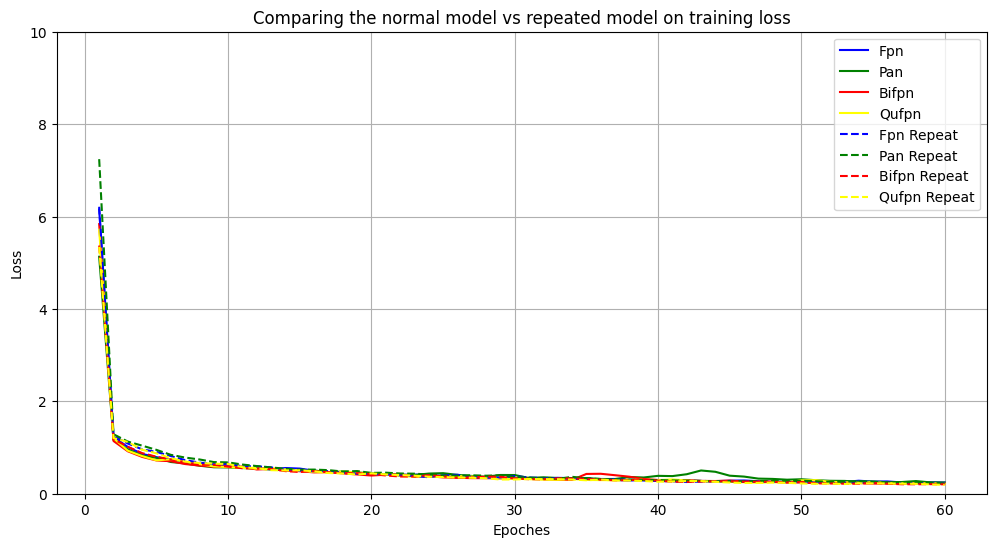

In [40]:
#Comparing the normal training loss vs repeated training loss
epochs = list(range(1, len(all_training_losses) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_training_losses, label='Training Loss', color='blue')
plt.plot(epochs, all_training_losses1, label='Training 1 Loss', color='green')
plt.plot(epochs, all_training_losses2, label='Training 2 Loss', color='red')
plt.plot(epochs, all_training_losses3, label='Training 3 Loss', color='yellow')
plt.plot(epochs, all_new_training_losses, label='New Training Loss', color='blue', linestyle='dashed')
plt.plot(epochs, all_new_training_losses1, label='New Training 1 Loss', color='green', linestyle='dashed')
plt.plot(epochs, all_new_training_losses2, label='New Training 2 Loss', color='red', linestyle='dashed')
plt.plot(epochs, all_new_training_losses3, label='New Training 3 Loss', color='yellow', linestyle='dashed')

plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.title('Comparing the normal model vs repeated model on training loss')

plt.ylim(0, 10)

plt.legend(['Fpn', 'Pan', 'Bifpn', 'Qufpn', 'Fpn Repeat', 'Pan Repeat', 'Bifpn Repeat', 'Qufpn Repeat'], loc='upper right')
plt.grid(True)

plt.savefig('training_losses.png')
plt.show()

validation loss

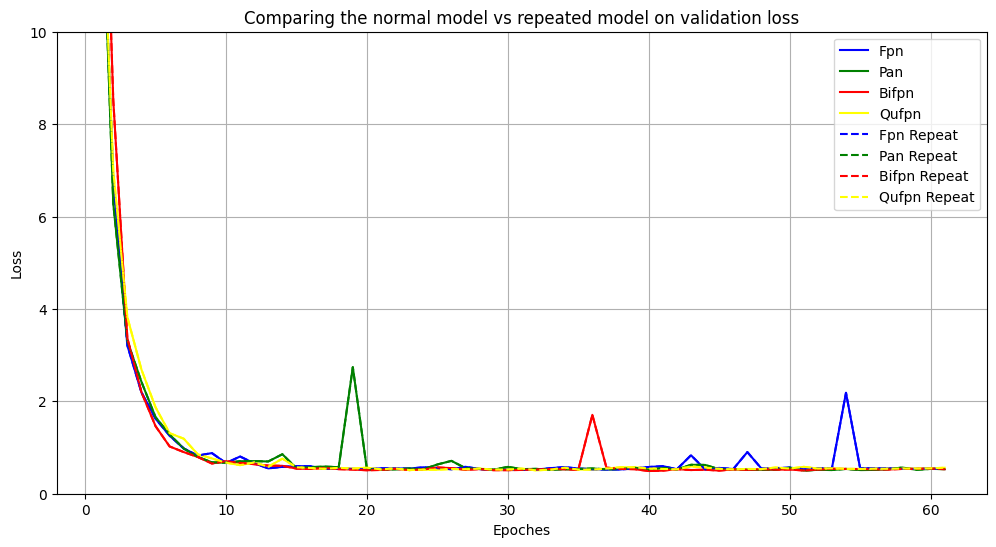

In [41]:
#Comparing the normal training loss vs repeated training loss
epochs = list(range(1, len(all_validation_losses) + 1))
epochs1 = list(range(1, len(all_validation_losses1) + 1))
epochs2 = list(range(1, len(all_new_validation_losses) + 1))
epochs3 = list(range(1, len(all_new_validation_losses1) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_validation_losses, label='Validation Loss', color='blue')
plt.plot(epochs1, all_validation_losses1, label='Validation 1 Loss', color='green')
plt.plot(epochs1, all_validation_losses2, label='Validation 2 Loss', color='red')
plt.plot(epochs1, all_validation_losses3, label='Validation 3 Loss', color='yellow')
plt.plot(epochs2, all_new_validation_losses, label='New Validation Loss', color='blue', linestyle='dashed')
plt.plot(epochs3, all_new_validation_losses1, label='New Validation 1 Loss', color='green', linestyle='dashed')
plt.plot(epochs3, all_new_validation_losses2, label='New Validation 2 Loss', color='red', linestyle='dashed')
plt.plot(epochs3, all_new_validation_losses3, label='New Validation 3 Loss', color='yellow', linestyle='dashed')

plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.title('Comparing the normal model vs repeated model on validation loss')

plt.ylim(0, 10)

plt.legend(['Fpn', 'Pan', 'Bifpn', 'Qufpn', 'Fpn Repeat', 'Pan Repeat', 'Bifpn Repeat', 'Qufpn Repeat'], loc='upper right')
plt.grid(True)

plt.savefig('validation_losses.png')
plt.show()

all loss

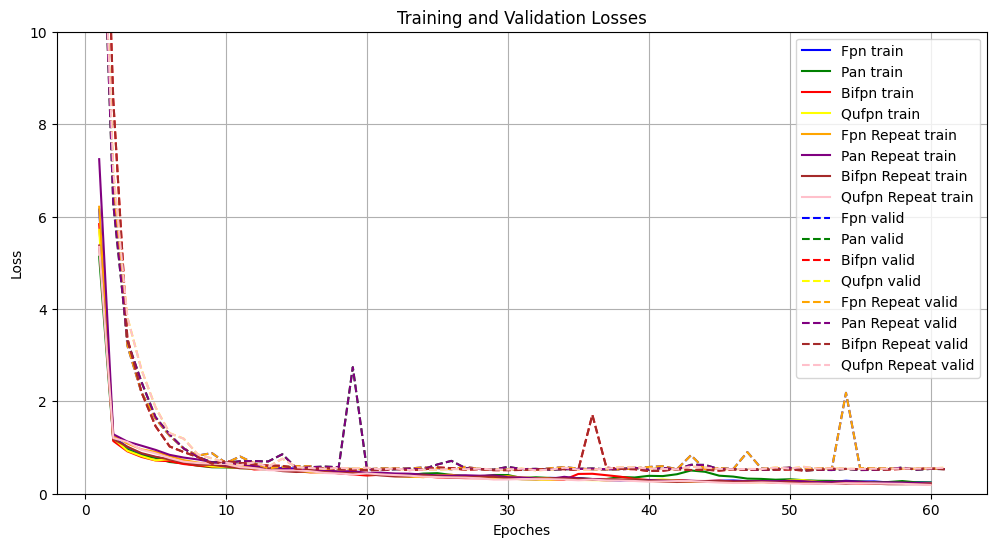

In [42]:
epochs = list(range(1, len(all_training_losses) + 1))
new_epochs = list(range(1, len(all_new_training_losses) + 1))
epochs_valid = list(range(1, len(all_validation_losses) + 1))
epochs_valid1 = list(range(1, len(all_validation_losses1) + 1))
new_epochs_valid = list(range(1, len(all_new_validation_losses) + 1))
new_epochs_valid2 = list(range(1, len(all_new_validation_losses1) + 1))
# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_training_losses, label='Training Loss', color='blue')
plt.plot(epochs, all_training_losses1, label='Training 1 Loss', color='green')
plt.plot(epochs, all_training_losses2, label='Training 2 Loss', color='red')
plt.plot(epochs, all_training_losses3, label='Training 3 Loss', color='yellow')
plt.plot(new_epochs, all_new_training_losses, label='New Training Loss', color='orange')
plt.plot(new_epochs, all_new_training_losses1, label='New Training 1 Loss', color='purple')
plt.plot(new_epochs, all_new_training_losses2, label='New Training 2 Loss', color='brown')
plt.plot(new_epochs, all_new_training_losses3, label='New Training 3 Loss', color='pink')

plt.plot(epochs_valid, all_validation_losses, label='Validation Loss', color='blue', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_losses1, label='Validation 1 Loss', color='green', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_losses2, label='Validation 2 Loss', color='red', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_losses3, label='Validation 3 Loss', color='yellow', linestyle='dashed')
plt.plot(new_epochs_valid, all_new_validation_losses, label='New Validation Loss', color='orange', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_losses1, label='New Validation 1 Loss', color='purple', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_losses2, label='New Validation 2 Loss', color='brown', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_losses3, label='New Validation 3 Loss', color='pink', linestyle='dashed')

plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')

plt.ylim(0, 10)

plt.legend(['Fpn train', 'Pan train', 'Bifpn train', 'Qufpn train', 'Fpn Repeat train', 'Pan Repeat train', 'Bifpn Repeat train', 'Qufpn Repeat train',
            'Fpn valid', 'Pan valid', 'Bifpn valid', 'Qufpn valid', 'Fpn Repeat valid', 'Pan Repeat valid', 'Bifpn Repeat valid', 'Qufpn Repeat valid'], loc='upper right')

plt.grid(True)

plt.savefig('Loss.png')
plt.show()

box loss

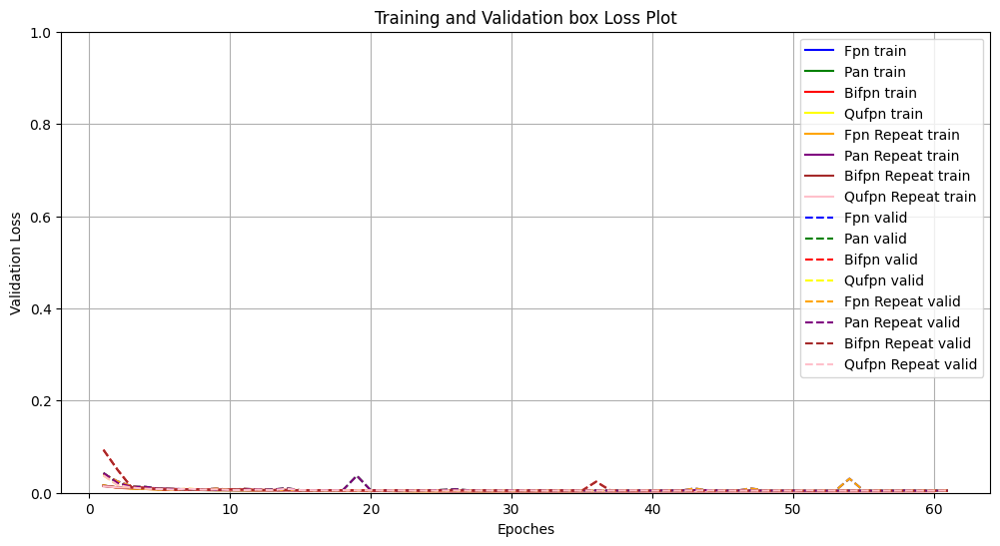

In [43]:
# epochs = list(range(1, len(all_training_box_losses) + 1))
# new_epochs = list(range(1, len(all_new_training_box_losses) + 1))
# epochs_valid = list(range(1, len(all_validation_box_losses) + 1))
# new_epochs_valid = list(range(1, len(all_new_validation_box_losses) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))

plt.plot(epochs, all_training_box_losses, label='Training Loss', color='blue')
plt.plot(epochs, all_training_box_losses1, label='Training 1 Loss', color='green')
plt.plot(epochs, all_training_box_losses2, label='Training 2 Loss', color='red')
plt.plot(epochs, all_training_box_losses3, label='Training 3 Loss', color='yellow')
plt.plot(new_epochs, all_new_training_box_losses, label='New Training Loss', color='orange')
plt.plot(new_epochs, all_new_training_box_losses1, label='New Training 1 Loss', color='purple')
plt.plot(new_epochs, all_new_training_box_losses2, label='New Training 2 Loss', color='brown')
plt.plot(new_epochs, all_new_training_box_losses3, label='New Training 3 Loss', color='pink')

plt.plot(epochs_valid, all_validation_box_losses, label='Validation Loss', color='blue', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_box_losses1, label='Validation 1 Loss', color='green', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_box_losses2, label='Validation 2 Loss', color='red', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_box_losses3, label='Validation 3 Loss', color='yellow', linestyle='dashed')
plt.plot(new_epochs_valid, all_new_validation_box_losses, label='New Validation Loss', color='orange', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_box_losses1, label='New Validation 1 Loss', color='purple', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_box_losses2, label='New Validation 2 Loss', color='brown', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_box_losses3, label='New Validation 3 Loss', color='pink', linestyle='dashed')

plt.xlabel('Epoches')
plt.ylabel('Validation Loss')
plt.title('Training and Validation box Loss Plot')

plt.ylim(0, 1)

plt.legend(['Fpn train', 'Pan train', 'Bifpn train', 'Qufpn train', 'Fpn Repeat train', 'Pan Repeat train', 'Bifpn Repeat train', 'Qufpn Repeat train',
            'Fpn valid', 'Pan valid', 'Bifpn valid', 'Qufpn valid', 'Fpn Repeat valid', 'Pan Repeat valid', 'Bifpn Repeat valid', 'Qufpn Repeat valid'], loc='upper right')
plt.grid(True)

plt.savefig('BOXLoss.png')
plt.show()

class loss

In [44]:
epochs = list(range(1, len(all_training_losses) + 1))
new_epochs = list(range(1, len(all_new_training_losses) + 1))
epochs_valid = list(range(1, len(all_validation_losses) + 1))
epochs_valid1 = list(range(1, len(all_validation_losses1) + 1))
new_epochs_valid = list(range(1, len(all_new_validation_losses) + 1))
new_epochs_valid2 = list(range(1, len(all_new_validation_losses1) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_training_class_losses, label='Training Loss', color='blue')
plt.plot(epochs, all_training_class_losses1, label='Training 1 Loss', color='green')
plt.plot(epochs, all_training_class_losses2, label='Training 2 Loss', color='red')
plt.plot(epochs, all_training_class_losses3, label='Training 3 Loss', color='yellow')
plt.plot(new_epochs, all_new_training_class_losses, label='New Training Loss', color='orange')
plt.plot(new_epochs, all_new_training_class_losses1, label='New Training 1 Loss', color='purple')
plt.plot(new_epochs, all_new_training_class_losses2, label='New Training 2 Loss', color='brown')
plt.plot(new_epochs, all_new_training_class_losses3, label='New Training 3 Loss', color='pink')

plt.plot(epochs_valid, all_validation_class_losses, label='Validation Loss', color='blue', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_class_losses1, label='Validation 1 Loss', color='green', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_class_losses2, label='Validation 2 Loss', color='red', linestyle='dashed')
plt.plot(epochs_valid1, all_validation_class_losses3, label='Validation 3 Loss', color='yellow', linestyle='dashed')
plt.plot(new_epochs_valid, all_new_validation_class_losses, label='New Validation Loss', color='orange', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_class_losses1, label='New Validation 1 Loss', color='purple', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_class_losses2, label='New Validation 2 Loss', color='brown', linestyle='dashed')
plt.plot(new_epochs_valid2, all_new_validation_class_losses3, label='New Validation 3 Loss', color='pink', linestyle='dashed')

plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.title('Training and Validation class Loss Plot')

plt.ylim(0, 5)

plt.legend(['Fpn train', 'Pan train', 'Bifpn train', 'Qufpn train', 'Fpn Repeat train', 'Pan Repeat train', 'Bifpn Repeat train', 'Qufpn Repeat train',
plt.grid(True)

plt.savefig('CLASSLoss.png')
plt.show()

validation metric

In [45]:
all_validation_AP_all = model.AP_all
all_validation_AP_all_IOU_0_50 = model.AP_all_IOU_0_50
all_validation_AP_all_IOU_0_75 = model.AP_all_IOU_0_75
all_validation_AR_all_dets_1 = model.AR_all_dets_1
all_validation_AR_all_dets_10 = model.AR_all_dets_10
all_validation_AR_all = model.AR_all

all_validation_AP_all1 = model1.AP_all
all_validation_AP_all_IOU_0_501 = model1.AP_all_IOU_0_50
all_validation_AP_all_IOU_0_751 = model1.AP_all_IOU_0_75
all_validation_AR_all_dets_11 = model1.AR_all_dets_1
all_validation_AR_all_dets_101 = model1.AR_all_dets_10
all_validation_AR_all1 = model1.AR_all

all_validation_AP_all2 = model2.AP_all
all_validation_AP_all_IOU_0_502 = model2.AP_all_IOU_0_50
all_validation_AP_all_IOU_0_752 = model2.AP_all_IOU_0_75
all_validation_AR_all_dets_12 = model2.AR_all_dets_1
all_validation_AR_all_dets_102 = model2.AR_all_dets_10
all_validation_AR_all2 = model2.AR_all

all_validation_AP_all3 = model3.AP_all
all_validation_AP_all_IOU_0_503 = model3.AP_all_IOU_0_50
all_validation_AP_all_IOU_0_753 = model3.AP_all_IOU_0_75
all_validation_AR_all_dets_13 = model3.AR_all_dets_1
all_validation_AR_all_dets_103 = model3.AR_all_dets_10
all_validation_AR_all3 = model3.AR_all


In [46]:
all_new_validation_AP_all = new_model.AP_all
all_new_validation_AP_all_IOU_0_50 =new_model.AP_all_IOU_0_50
all_new_validation_AP_all_IOU_0_75 = new_model.AP_all_IOU_0_75
all_new_validation_AR_all_dets_1 = new_model.AR_all_dets_1
all_new_validation_AR_all_dets_10 = new_model.AR_all_dets_10
all_new_validation_AR_all = new_model.AR_all

all_new_validation_AP_all1 = new_model1.AP_all
all_new_validation_AP_all_IOU_0_501 =new_model1.AP_all_IOU_0_50
all_new_validation_AP_all_IOU_0_751 = new_model1.AP_all_IOU_0_75
all_new_validation_AR_all_dets_11 = new_model1.AR_all_dets_1
all_new_validation_AR_all_dets_101 = new_model1.AR_all_dets_10
all_new_validation_AR_all1 = new_model1.AR_all

all_new_validation_AP_all2 = new_model2.AP_all
all_new_validation_AP_all_IOU_0_502 =new_model2.AP_all_IOU_0_50
all_new_validation_AP_all_IOU_0_752 = new_model2.AP_all_IOU_0_75
all_new_validation_AR_all_dets_12 = new_model2.AR_all_dets_1
all_new_validation_AR_all_dets_102 = new_model2.AR_all_dets_10
all_new_validation_AR_all2 = new_model2.AR_all

all_new_validation_AP_all3 = new_model3.AP_all
all_new_validation_AP_all_IOU_0_503 =new_model3.AP_all_IOU_0_50
all_new_validation_AP_all_IOU_0_753 = new_model3.AP_all_IOU_0_75
all_new_validation_AR_all_dets_13 = new_model3.AR_all_dets_1
all_new_validation_AR_all_dets_103 = new_model3.AR_all_dets_10
all_new_validation_AR_all3 = new_model3.AR_all

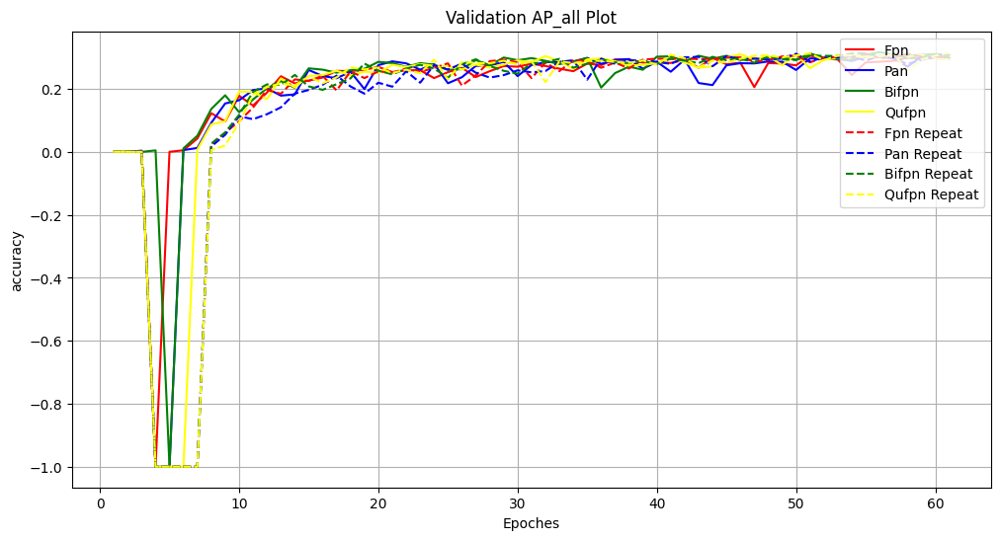

In [48]:
#AP_all

#Plotting the losses
epochs = list(range(1, len(all_validation_AP_all) + 1))
epochs1 = list(range(1, len(all_validation_AP_all1) + 1))

epochs2 = list(range(1, len(all_new_validation_AP_all) + 1))
# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_validation_AP_all, label='all_validation_AP_all', color='red')
plt.plot(epochs1, all_validation_AP_all1, label='all_validation_AP_all1', color='blue')
plt.plot(epochs1, all_validation_AP_all2, label='all_validation_AP_all2', color='green')
plt.plot(epochs1, all_validation_AP_all3, label='all_validation_AP_all3', color='yellow')
plt.plot(epochs2, all_new_validation_AP_all, label='all_new_validation_AP_all', color='red', linestyle='dashed')
plt.plot(epochs1, all_new_validation_AP_all1, label='all_new_validation_AP_all1', color='blue', linestyle='dashed')
plt.plot(epochs1, all_new_validation_AP_all2, label='all_new_validation_AP_all2', color='green', linestyle='dashed')
plt.plot(epochs1, all_new_validation_AP_all3, label='all_new_validation_AP_all3', color='yellow', linestyle='dashed')

plt.xlabel('Epoches')
plt.ylabel('accuracy')
plt.title('Validation AP_all Plot')
plt.legend(['Fpn', 'Pan', 'Bifpn', 'Qufpn', 'Fpn Repeat', 'Pan Repeat', 'Bifpn Repeat', 'Qufpn Repeat'], loc='upper right')
plt.grid(True)

plt.savefig('AP_all.png')
plt.show()

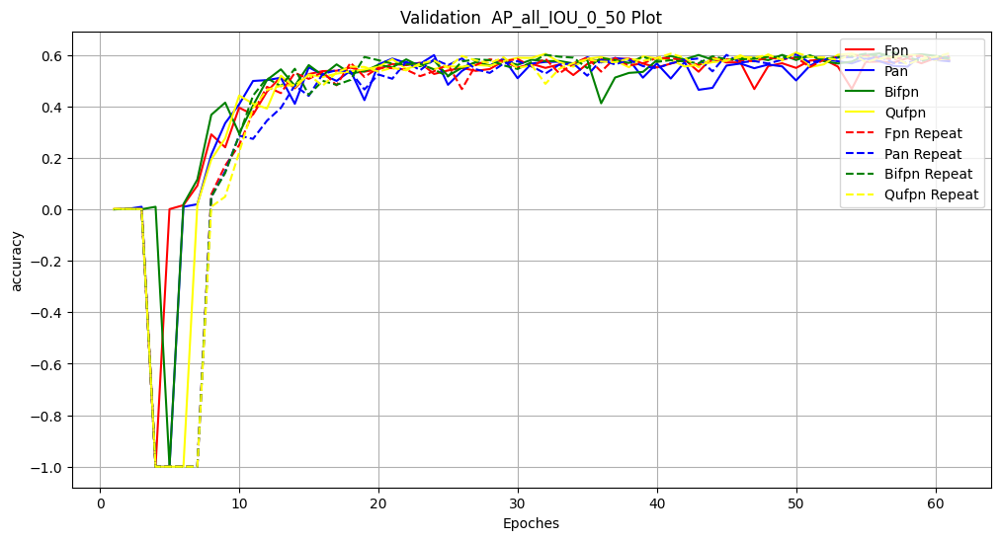

In [49]:
#AP_all_IOU_0_50

#Plotting the losses
epochs = list(range(1, len(all_validation_AP_all_IOU_0_502) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_validation_AP_all_IOU_0_50, label='all_validation_AP_all', color='red')
plt.plot(epochs, all_validation_AP_all_IOU_0_501, label='all_validation_AP_all1', color='blue')
plt.plot(epochs, all_validation_AP_all_IOU_0_502, label='all_validation_AP_all2', color='green')
plt.plot(epochs, all_validation_AP_all_IOU_0_503, label='all_validation_AP_all3', color='yellow')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_50, label='all_new_validation_AP_all', color='red', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_501, label='all_new_validation_AP_all1', color='blue', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_502, label='all_new_validation_AP_all2', color='green', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_503, label='all_new_validation_AP_all3', color='yellow', linestyle='dashed')



plt.xlabel('Epoches')
plt.ylabel('accuracy')
plt.title('Validation  AP_all_IOU_0_50 Plot')
plt.legend(['Fpn', 'Pan', 'Bifpn', 'Qufpn', 'Fpn Repeat', 'Pan Repeat', 'Bifpn Repeat', 'Qufpn Repeat'], loc='upper right')
plt.grid(True)

plt.savefig('AP_all_IOU_0_50.png')
plt.show()

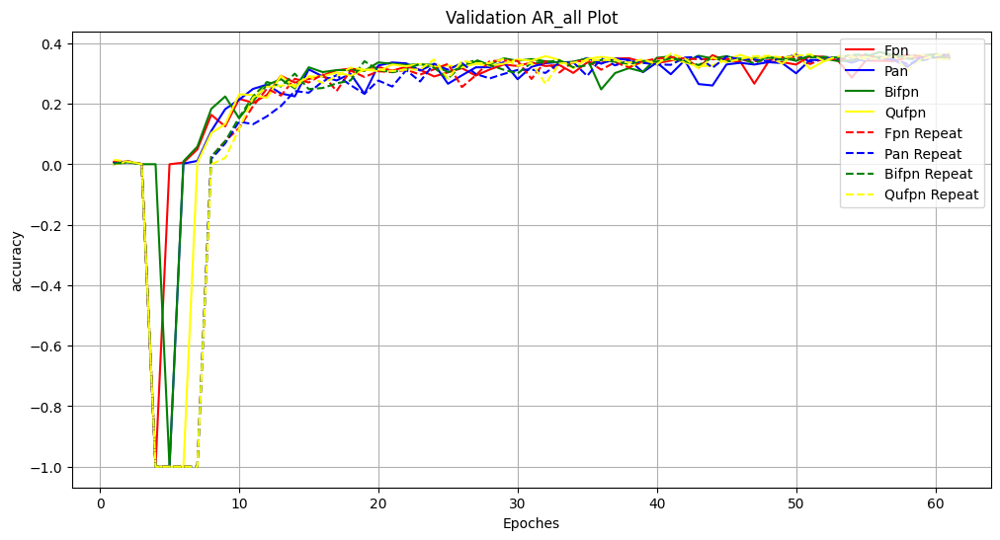

In [50]:
#AP_all_IOU_0_75

#Plotting the losses
epochs = list(range(1, len(all_validation_AP_all) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_validation_AR_all, label='all_validation_Ar_all', color='red')
plt.plot(epochs, all_validation_AR_all1, label='all_validation_AR_all1', color='blue')
plt.plot(epochs, all_validation_AR_all2, label='all_validation_AR_all2', color='green')
plt.plot(epochs, all_validation_AR_all3, label='all_validation_AR_all3', color='yellow')
plt.plot(epochs, all_new_validation_AR_all, label='all_new_validation_AR_all', color='red', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all1, label='all_new_validation_AR_all1', color='blue', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all2, label='all_new_validation_AR_all2', color='green', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all3, label='all_new_validation_AR_all3', color='yellow', linestyle='dashed')



plt.xlabel('Epoches')
plt.ylabel('accuracy')
plt.title('Validation AR_all Plot')
plt.legend(['Fpn', 'Pan', 'Bifpn', 'Qufpn', 'Fpn Repeat', 'Pan Repeat', 'Bifpn Repeat', 'Qufpn Repeat'], loc='upper right')
plt.grid(True)

plt.savefig('AR_all.png')
plt.show()


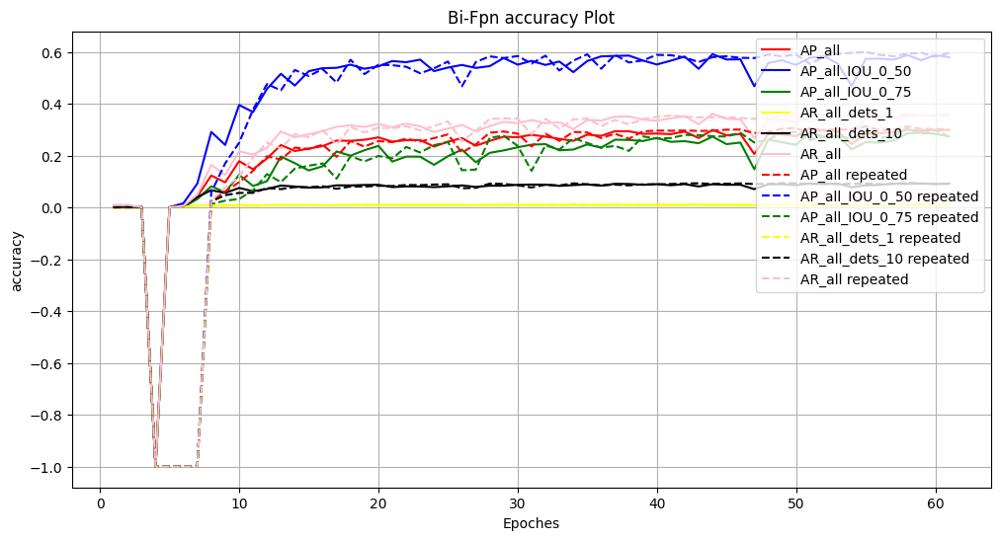

In [51]:
#Bifpn

#Plotting the losses
epochs = list(range(1, len(all_validation_AP_all) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_validation_AP_all, label='all_validation_AP_all', color='red')
plt.plot(epochs, all_validation_AP_all_IOU_0_50, label='all_validation_AP_all_IOU_0_50', color='blue')
plt.plot(epochs, all_validation_AP_all_IOU_0_75, label='all_validation_AP_all_IOU_0_75', color='green')
plt.plot(epochs, all_validation_AR_all_dets_1, label='all_validation_AR_all_dets_1', color='yellow')
plt.plot(epochs, all_validation_AR_all_dets_10, label='all_validation_AR_all_dets_10', color='black')
plt.plot(epochs, all_validation_AR_all, label='all_validation_AR_all', color='pink')

plt.plot(epochs, all_new_validation_AP_all, label='all_new_validation_AP_all', color='red', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_50, label='all_new_validation_AP_all_IOU_0_50', color='blue', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_75, label='all_new_validation_AP_all_IOU_0_75', color='green', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all_dets_1, label='all_new_validation_AR_all_dets_1', color='yellow', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all_dets_10, label='all_new_validation_AR_all_dets_10', color='black', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all, label='all_new_validation_AR_all', color='pink', linestyle='dashed')



plt.xlabel('Epoches')
plt.ylabel('accuracy')
plt.title('Bi-Fpn accuracy Plot')
plt.legend(['AP_all', 'AP_all_IOU_0_50', 'AP_all_IOU_0_75', 'AR_all_dets_1', 'AR_all_dets_10', 'AR_all', 'AP_all repeated', 'AP_all_IOU_0_50 repeated', 'AP_all_IOU_0_75 repeated', 'AR_all_dets_1 repeated', 'AR_all_dets_10 repeated', 'AR_all repeated'], loc='upper right')
plt.grid(True)

plt.savefig('comparing_FPN_validationMetrics.png')
plt.show()

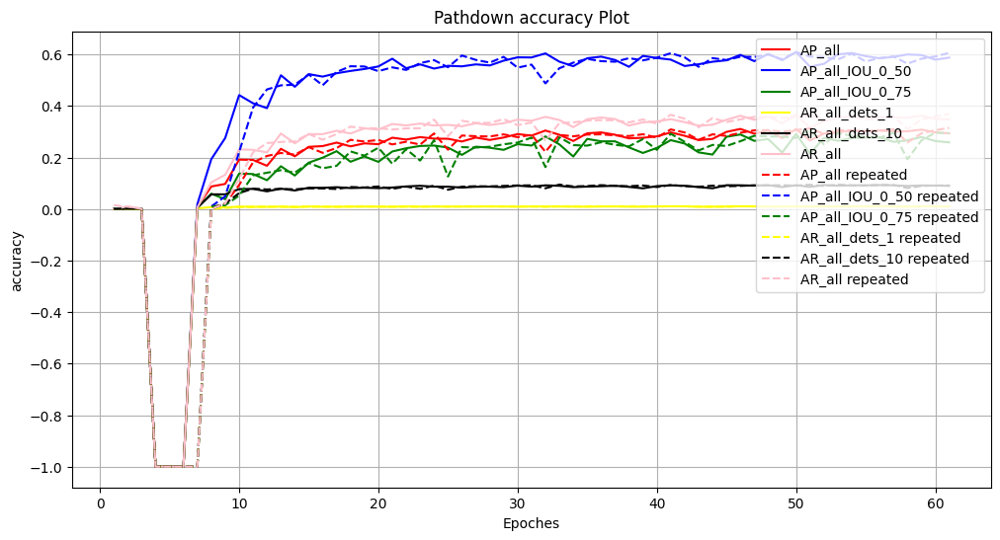

In [52]:
#Plotting the losses
epochs = list(range(1, len(all_validation_AP_all3) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_validation_AP_all3, label='all_validation_AP_all', color='red')
plt.plot(epochs, all_validation_AP_all_IOU_0_503, label='all_validation_AP_all_IOU_0_50', color='blue')
plt.plot(epochs, all_validation_AP_all_IOU_0_753, label='all_validation_AP_all_IOU_0_75', color='green')
plt.plot(epochs, all_validation_AR_all_dets_13, label='all_validation_AR_all_dets_1', color='yellow')
plt.plot(epochs, all_validation_AR_all_dets_103, label='all_validation_AR_all_dets_10', color='black')
plt.plot(epochs, all_validation_AR_all3, label='all_validation_AR_all', color='pink')

plt.plot(epochs, all_new_validation_AP_all3, label='all_new_validation_AP_all', color='red', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_503, label='all_new_validation_AP_all_IOU_0_50', color='blue', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_753, label='all_new_validation_AP_all_IOU_0_75', color='green', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all_dets_13, label='all_new_validation_AR_all_dets_1', color='yellow', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all_dets_103, label='all_new_validation_AR_all_dets_10', color='black', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all3, label='all_new_validation_AR_all', color='pink', linestyle='dashed')



plt.xlabel('Epoches')
plt.ylabel('accuracy')
plt.title('Pathdown accuracy Plot')
plt.legend(['AP_all', 'AP_all_IOU_0_50', 'AP_all_IOU_0_75', 'AR_all_dets_1', 'AR_all_dets_10', 'AR_all', 'AP_all repeated', 'AP_all_IOU_0_50 repeated', 'AP_all_IOU_0_75 repeated', 'AR_all_dets_1 repeated', 'AR_all_dets_10 repeated', 'AR_all repeated'], loc='upper right')
plt.grid(True)

plt.savefig('comparing_QuadFpn_validationMetrics.png')
plt.show()

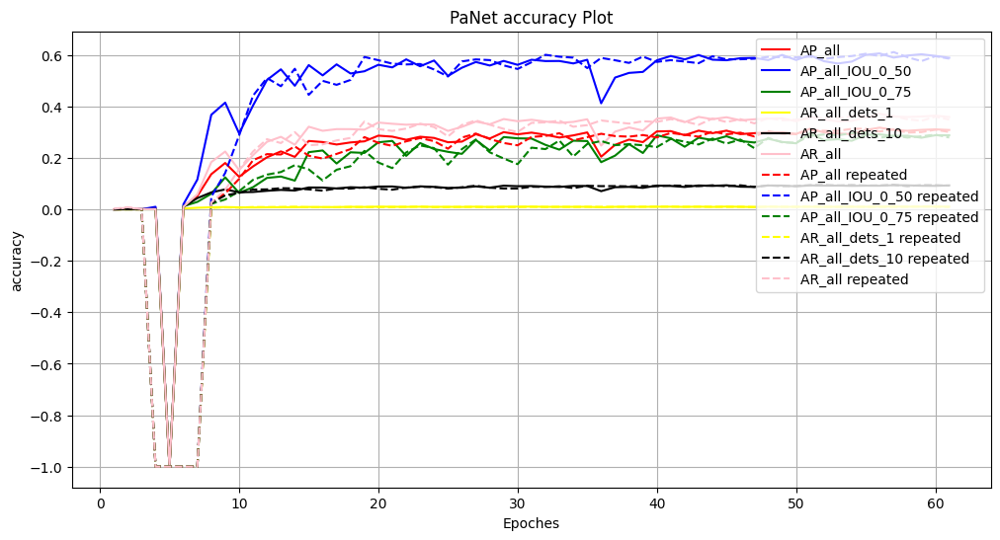

In [53]:
#Plotting the losses
epochs = list(range(1, len(all_validation_AP_all1) + 1))

# Create the training and validation loss plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, all_validation_AP_all2, label='all_validation_AP_all2', color='red')
plt.plot(epochs, all_validation_AP_all_IOU_0_502, label='all_validation_AP_all_IOU_0_502', color='blue')
plt.plot(epochs, all_validation_AP_all_IOU_0_752, label='all_validation_AP_all_IOU_0_752', color='green')
plt.plot(epochs, all_validation_AR_all_dets_12, label='all_validation_AR_all_dets_12', color='yellow')
plt.plot(epochs, all_validation_AR_all_dets_102, label='all_validation_AR_all_dets_102', color='black')
plt.plot(epochs, all_validation_AR_all2, label='all_validation_AR_all2', color='pink')

plt.plot(epochs, all_new_validation_AP_all2, label='all_new_validation_AP_all2', color='red', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_502, label='all_new_validation_AP_all_IOU_0_502', color='blue', linestyle='dashed')
plt.plot(epochs, all_new_validation_AP_all_IOU_0_752, label='all_new_validation_AP_all_IOU_0_752', color='green', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all_dets_12, label='all_new_validation_AR_all_dets_12', color='yellow', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all_dets_102, label='all_new_validation_AR_all_dets_102', color='black', linestyle='dashed')
plt.plot(epochs, all_new_validation_AR_all2, label='all_new_validation_AR_all2', color='pink', linestyle='dashed')


plt.xlabel('Epoches')
plt.ylabel('accuracy')
plt.title('PaNet accuracy Plot')
plt.legend(['AP_all', 'AP_all_IOU_0_50', 'AP_all_IOU_0_75', 'AR_all_dets_1', 'AR_all_dets_10', 'AR_all', 'AP_all repeated', 'AP_all_IOU_0_50 repeated', 'AP_all_IOU_0_75 repeated', 'AR_all_dets_1 repeated', 'AR_all_dets_10 repeated', 'AR_all repeated'], loc='upper right')
plt.grid(True)
plt.savefig('comparing_Bipn_validationMetrics.png')
plt.show()

Saved Model

In [54]:
torch.save(model.state_dict(), 'Saved_Model/trained_effdet_1_fpn.pth')
torch.save(model1.state_dict(), 'Saved_Model/trained_effdet_1_pan.pth')
torch.save(model2.state_dict(), 'Saved_Model/trained_effdet_1_bifpn.pth')
torch.save(model3.state_dict(), 'Saved_Model/trained_effdet_1_qufpn.pth')

torch.save(new_model.state_dict(), 'Saved_Model/trained_effdet_1_fpn_repeat.pth')
torch.save(new_model1.state_dict(), 'Saved_Model/trained_effdet_1_pan_repeat.pth')
torch.save(new_model2.state_dict(), 'Saved_Model/trained_effdet_1_bifpn_repeat.pth')
torch.save(new_model3.state_dict(), 'Saved_Model/trained_effdet_1_qufpn_repeat.pth')


Load the model

In [55]:
model = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'standard_fpn', 1)
    )
model1 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'pan_fa', 1)
    )
model2 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'bifpn_fa', 1)
    )
model3 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'qufpn_fa', 1)
    )

new_model = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'standard_fpn', 3)
    )
new_model1 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'pan_fa', 3)
    )
new_model2 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'bifpn_fa', 3)
    )
new_model3 = EfficientDetModel(
    num_classes=1,
    img_size=512,
    create_model_1 = create_model(1, 512, 'tf_efficientdet_d3', 'qufpn_fa', 3)
    )

model.load_state_dict(torch.load('Saved_Model/trained_effdet_1_fpn.pth'))
model1.load_state_dict(torch.load('Saved_Model/trained_effdet_1_pan.pth'))
model2.load_state_dict(torch.load('Saved_Model/trained_effdet_1_bifpn.pth'))
model3.load_state_dict(torch.load('Saved_Model/trained_effdet_1_qufpn.pth'))

new_model.load_state_dict(torch.load('Saved_Model/trained_effdet_1_fpn_repeat.pth'))
new_model1.load_state_dict(torch.load('Saved_Model/trained_effdet_1_pan_repeat.pth'))
new_model2.load_state_dict(torch.load('Saved_Model/trained_effdet_1_bifpn_repeat.pth'))
new_model3.load_state_dict(torch.load('Saved_Model/trained_effdet_1_qufpn_repeat.pth'))

{'name': 'tf_efficientdet_d3', 'backbone_name': 'tf_efficientnetv2_b3', 'backbone_args': {'drop_path_rate': 0.2}, 'backbone_indices': None, 'image_size': [512, 512], 'num_classes': 1, 'min_level': 3, 'max_level': 7, 'num_levels': 5, 'num_scales': 3, 'aspect_ratios': [[1.0, 1.0], [1.4, 0.7], [0.7, 1.4]], 'anchor_scale': 4.0, 'pad_type': 'same', 'act_type': 'swish', 'norm_layer': None, 'norm_kwargs': {'eps': 0.001, 'momentum': 0.01}, 'box_class_repeats': 3, 'fpn_cell_repeats': 1, 'fpn_channels': 88, 'separable_conv': True, 'apply_resample_bn': True, 'conv_bn_relu_pattern': False, 'downsample_type': 'max', 'upsample_type': 'nearest', 'redundant_bias': True, 'head_bn_level_first': False, 'head_act_type': None, 'fpn_name': None, 'fpn_config': {'nodes': [{'feat_level': 7, 'inputs_offsets': [4], 'weight_method': 'fastattn'}, {'feat_level': 6, 'inputs_offsets': [3, 5], 'weight_method': 'fastattn'}, {'feat_level': 5, 'inputs_offsets': [2, 6], 'weight_method': 'fastattn'}, {'feat_level': 4, 'inp

<All keys matched successfully>

In [ ]:
# evaluate the model
model.eval()
model1.eval()
model2.eval()
model3.eval()
new_model.eval()
new_model1.eval()
new_model2.eval()
new_model3.eval()

In [57]:
# Test the model with images
image1, truth_bboxes1, _, _ = fossil_test_ds.get_image_and_labels_by_idx(0)
image2, truth_bboxes2, _, _ = fossil_test_ds.get_image_and_labels_by_idx(1)
image3, truth_bboxes3, _, _ = fossil_test_ds.get_image_and_labels_by_idx(8)
images = [image1, image2, image3]
truth_bboxes = [truth_bboxes1, truth_bboxes2, truth_bboxes3]

In [58]:
def compare_bboxes_for_image(
    image,
    predicted_bboxes,
    predicted_bboxes1,
    predicted_bboxes2,
    predicted_bboxes3,
    predicted_bboxes4,
    predicted_bboxes5,
    predicted_bboxes6,
    predicted_bboxes7,
    actual_bboxes,
    draw_bboxes_fn=draw_pascal_voc_bboxes,
    figsize=(20, 20),
):
    fig, axe= plt.subplots( 2, 5, figsize=figsize )
    ax1 = axe[0][0]
    ax1.imshow(image)
    ax1.set_title("Bi-Fpn")
    ax2 = axe[0][1]
    ax2.imshow(image)
    ax2.set_title("PaNet")
    ax3 = axe[0][2]
    ax3.imshow(image)
    ax3.set_title("Quad-Fpn")
    ax4 = axe[0][3]
    ax4.imshow(image)
    ax4.set_title("Path-Down")
    ax5 = axe[0][4]
    ax5.imshow(image)
    ax5.set_title("Actual")

    ax6 = axe[1][0]
    ax6.imshow(image)
    ax6.set_title("Bi-Fpn repeated")
    ax7 = axe[1][1]
    ax7.imshow(image)
    ax7.set_title("PaNet repeated")
    ax8 = axe[1][2]
    ax8.imshow(image)
    ax8.set_title("Quad-Fpn repeated")
    ax9 = axe[1][3]
    ax9.imshow(image)
    ax9.set_title("Path-Down repeated")
    ax10 = axe[1][4]
    ax10.imshow(image)
    ax10.set_title("Actual")


    draw_bboxes_fn(ax1, predicted_bboxes)
    draw_bboxes_fn(ax2, predicted_bboxes1)
    draw_bboxes_fn(ax3, predicted_bboxes2)
    draw_bboxes_fn(ax4, predicted_bboxes3)
    draw_bboxes_fn(ax5, actual_bboxes)

    draw_bboxes_fn(ax6, predicted_bboxes4)
    draw_bboxes_fn(ax7, predicted_bboxes5)
    draw_bboxes_fn(ax8, predicted_bboxes6)
    draw_bboxes_fn(ax9, predicted_bboxes7)
    draw_bboxes_fn(ax10, actual_bboxes)

    image_name = image.filename.split("/")[-1]
    plt.tight_layout()
    plt.savefig(f"comparison_{image_name}.png")
    plt.show()

In [59]:
predicted_bboxes, predicted_class_labels, predicted_class_confidences = model.predict(images)
predicted_bboxes1, predicted_class_labels1, predicted_class_confidences1 = model1.predict(images)
predicted_bboxes2, predicted_class_labels2, predicted_class_confidences2 = model2.predict(images)
predicted_bboxes3, predicted_class_labels3, predicted_class_confidences3 = model3.predict(images)

predicted_bboxes4, predicted_class_labels4, predicted_class_confidences4 = new_model.predict(images)
predicted_bboxes5, predicted_class_labels5, predicted_class_confidences5 = new_model1.predict(images)
predicted_bboxes6, predicted_class_labels6, predicted_class_confidences6 = new_model2.predict(images)
predicted_bboxes7, predicted_class_labels7, predicted_class_confidences7 = new_model3.predict(images)




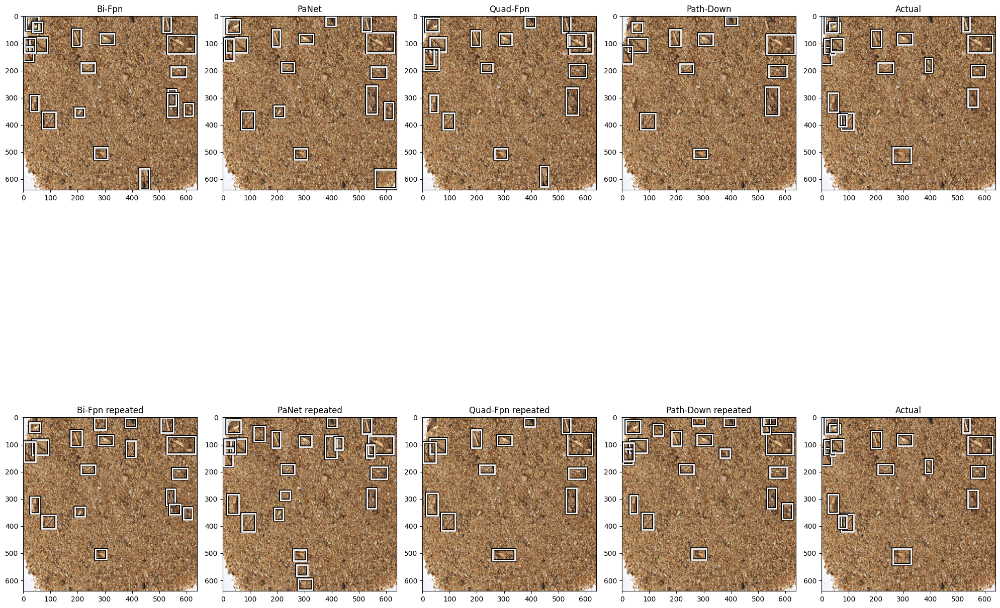

In [60]:
compare_bboxes_for_image(image1, predicted_bboxes[0], predicted_bboxes1[0], predicted_bboxes2[0], predicted_bboxes3[0], predicted_bboxes4[0], predicted_bboxes5[0], predicted_bboxes6[0], predicted_bboxes7[0], truth_bboxes[0])

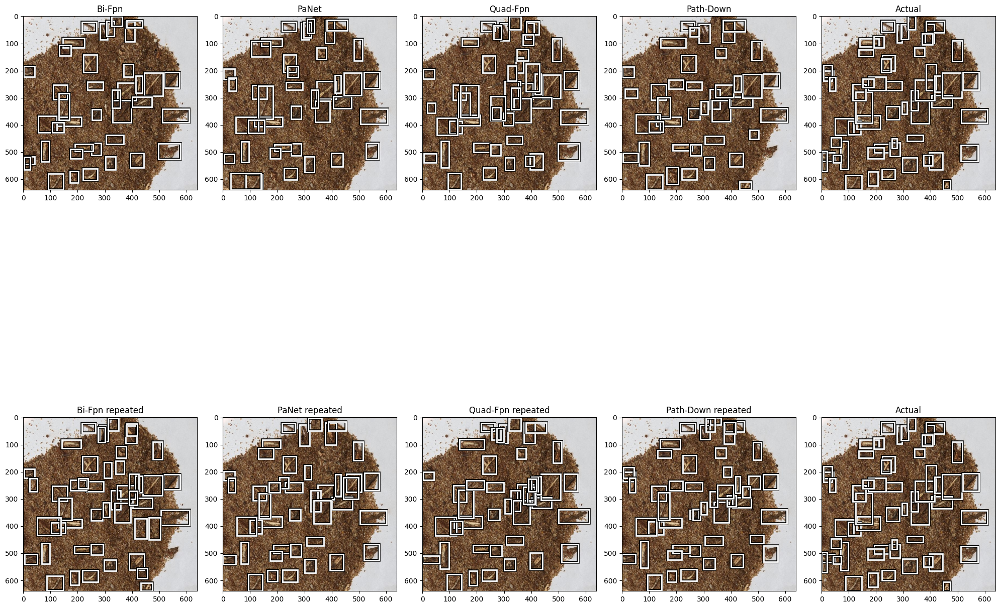

In [61]:
compare_bboxes_for_image(image2, predicted_bboxes[1], predicted_bboxes1[1], predicted_bboxes2[1], predicted_bboxes3[1], predicted_bboxes4[1], predicted_bboxes5[1], predicted_bboxes6[1], predicted_bboxes7[1], truth_bboxes[1])

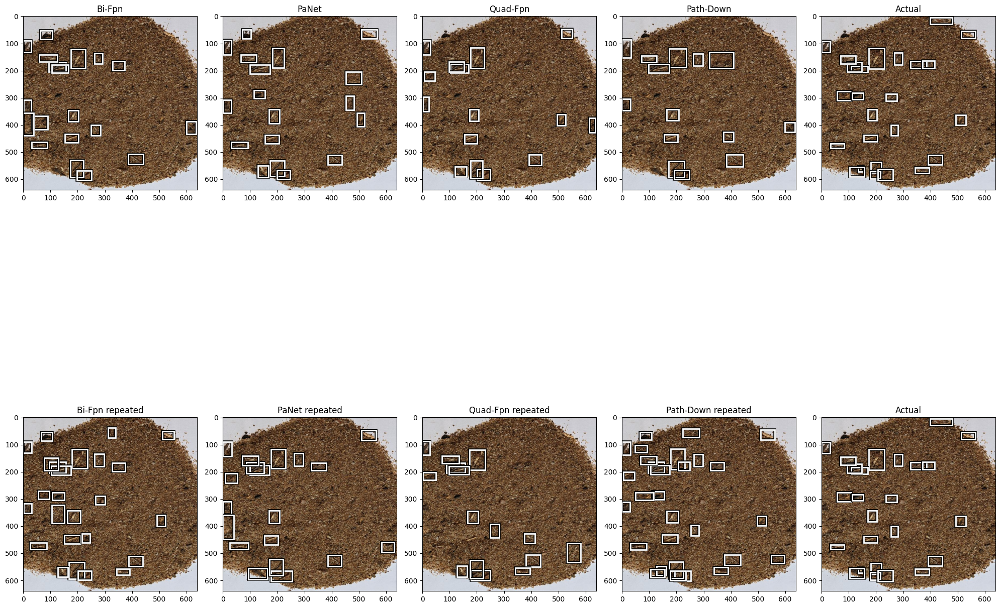

In [62]:
compare_bboxes_for_image(image3, predicted_bboxes[2], predicted_bboxes1[2], predicted_bboxes2[2], predicted_bboxes3[2], predicted_bboxes4[2], predicted_bboxes5[2], predicted_bboxes6[2], predicted_bboxes7[2], truth_bboxes[2])

Validation outputs and Coco metrics

In [63]:
loader = dm.test_dataloader()
dl_iter = iter(loader)
batch = next(dl_iter)

In [64]:
output = model.validation_step(batch=batch, batch_idx=0)
output1 = model1.validation_step(batch=batch, batch_idx=0)
output2 = model2.validation_step(batch=batch, batch_idx=0)
output3 = model3.validation_step(batch=batch, batch_idx=0)

output4 = new_model.validation_step(batch=batch, batch_idx=0)
output5 = new_model1.validation_step(batch=batch, batch_idx=0)
output6 = new_model2.validation_step(batch=batch, batch_idx=0)
output7 = new_model3.validation_step(batch=batch, batch_idx=0)


In [65]:
@patch
def aggregate_prediction_outputs(self: EfficientDetModel, outputs):

    detections = torch.cat(
        [output["batch_predictions"]["predictions"] for output in outputs]
    )

    image_ids = []
    targets = []
    for output in outputs:
        batch_predictions = output["batch_predictions"]
        image_ids.extend(batch_predictions["image_ids"])
        targets.extend(batch_predictions["targets"])

    (
        predicted_bboxes,
        predicted_class_confidences,
        predicted_class_labels,
    ) = self.post_process_detections(detections)

    return (
        predicted_class_labels,
        image_ids,
        predicted_bboxes,
        predicted_class_confidences,
        targets,
    )

In [67]:
@patch
def validation_epoch_end(self: EfficientDetModel, outputs):
    """Compute and log training loss and accuracy at the epoch level."""

    validation_loss_mean = torch.stack(
        [output["loss"] for output in outputs]
    ).mean()

    (
        predicted_class_labels,
        image_ids,
        predicted_bboxes,
        predicted_class_confidences,
        targets,
    ) = self.aggregate_prediction_outputs(outputs)

    truth_image_ids = [target["image_id"].detach().item() for target in targets]
    truth_boxes = [
        target["bboxes"].detach()[:, [1, 0, 3, 2]].tolist() for target in targets
    ] # convert to xyxy for evaluation
    truth_labels = [target["labels"].detach().tolist() for target in targets]

    stats = get_coco_stats(
        prediction_image_ids=image_ids,
        predicted_class_confidences=predicted_class_confidences,
        predicted_bboxes=predicted_bboxes,
        predicted_class_labels=predicted_class_labels,
        target_image_ids=truth_image_ids,
        target_bboxes=truth_boxes,
        target_class_labels=truth_labels,
    )['All']

    return {"val_loss": validation_loss_mean, "metrics": stats}

In [ ]:
result= model.validation_epoch_end([output])
result1=model1.validation_epoch_end([output1])
result2=model2.validation_epoch_end([output2])
result3=model3.validation_epoch_end([output3])

result4= new_model.validation_epoch_end([output4])
result5=new_model1.validation_epoch_end([output5])
result6=new_model2.validation_epoch_end([output6])
result7=new_model3.validation_epoch_end([output7])


Test the model with the test dataset

In [69]:
# Create a table header
table = "+----------------------+---------+---------+---------+---------+-----------+-----------+-----------+-----------+\n"
# table += "| Metric               | Bi-FPN  | PaNet   | QuadFPN | PathDown|  Bi-FPN-R |  PaNet-R  | QuadFPN-R | PathDown-R|\n"
table += "| Metric               |  FPN    |  Pan    |  BiFPN  |  QuadFPN|  FPN-R    |  Pan-R    |  BiFPN-R  |  QuadFPN-R|\n"
table += "+----------------------+---------+---------+---------+---------+-----------+-----------+-----------+-----------+\n"

# Populate the table with metrics and results
metrics = list(result2['metrics'].keys())
for metric in metrics:
    value = result['metrics'][metric]
    value1 = result1['metrics'][metric]
    value2 = result2['metrics'][metric]
    value3 = result3['metrics'][metric]

    value4 = result4['metrics'][metric]
    value5 = result5['metrics'][metric]
    value6 = result6['metrics'][metric]
    value7 = result7['metrics'][metric]

    table += f"| {metric:<20} | {value:.4f}  | {value1:.4f}  | {value2:.4f}  | {value3:.4f}  |  {value4:.4f}   |  {value5:.4f}   |  {value6:.4f}   |  {value7:.4f}   |\n"

# Add validation loss
val_loss = result['val_loss']
val_loss1 = result1['val_loss']
val_loss2 = result2['val_loss']
val_loss3 = result3['val_loss']

val_loss4 = result4['val_loss']
val_loss5 = result5['val_loss']
val_loss6 = result6['val_loss']
val_loss7 = result7['val_loss']

table += "+----------------------+---------+---------+---------+---------+-----------+-----------+-----------+-----------+\n"
table += f"| Validation Loss      | {val_loss:.4f}  | {val_loss1:.4f}  | {val_loss2:.4f}  | {val_loss3:.4f}  |  {val_loss4:.4f}   |  {val_loss5:.4f}   |  {val_loss6:.4f}   |  {val_loss7:.4f}   |\n"

# Add the table footer
table += "+----------------------+---------+---------+---------+---------+-----------+-----------+-----------+-----------+\n"

# Print the table
print(table)

+----------------------+---------+---------+---------+---------+-----------+-----------+-----------+-----------+
| Metric               |  FPN    |  Pan    |  BiFPN  |  QuadFPN|  FPN-R    |  Pan-R    |  BiFPN-R  |  QuadFPN-R|
+----------------------+---------+---------+---------+---------+-----------+-----------+-----------+-----------+
| AP_all               | 0.3125  | 0.3316  | 0.3302  | 0.3217  |  0.2920   |  0.3390   |  0.3379   |  0.3211   |
| AP_all_IOU_0_50      | 0.5963  | 0.6127  | 0.6120  | 0.6131  |  0.6096   |  0.6083   |  0.6412   |  0.6103   |
| AP_all_IOU_0_75      | 0.3024  | 0.3419  | 0.3423  | 0.3098  |  0.2317   |  0.3398   |  0.3366   |  0.3128   |
| AP_small             | 0.0558  | 0.0800  | 0.0725  | 0.0744  |  0.0658   |  0.0471   |  0.0702   |  0.0764   |
| AP_medium            | 0.3793  | 0.3991  | 0.3967  | 0.3888  |  0.3502   |  0.4161   |  0.4076   |  0.3817   |
| AP_large             | 0.4332  | 0.3832  | 0.4045  | 0.4019  |  0.3738   |  0.2832   |  0.5030